In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 2000)
pd.set_option('display.float_format', '{:20.2f}'.format)
pd.set_option('display.max_colwidth', None)

In [2]:
df = pd.read_csv('/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Train_Kaggle.csv')

In [3]:
df

,row_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,NaN,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,NaN,0.77,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,NaN,0.72,0.62,-1.01,-0.97,0.02,NaN,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,NaN,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,NaN,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,NaN,-2.11,NaN,NaN,0.66,0.96,NaN,NaN,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,NaN,0.91,-0.97,-0.77,-0.97,0.02,NaN,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,NaN,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,NaN,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,NaN,0.99,NaN,NaN,0.67,0.46,NaN,NaN,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,NaN,1.52,0.68,-0.85,0.37,0.02,NaN,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,NaN,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,NaN,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,0.93,-0.98,-0.04,NaN,NaN,NaN,NaN,NaN,-0.09,NaN,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,NaN,0.10,NaN,NaN,0.81,0.65,NaN,NaN,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,NaN,1.41,0.02,2.46,-0.97,0.02,-1.61,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,NaN,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,NaN,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,1.71,0.42,-0.83,NaN,NaN,NaN,NaN,NaN,0.01,NaN,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,NaN,0.70,NaN,NaN,0.87,2.47,NaN,NaN,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,NaN,0.93,0.90,-1.49,0.40,0.02,NaN,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,NaN,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-3.97,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,NaN,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,NaN,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,NaN,-1.44,-1.19,NaN,NaN,0.34,0.56,0.25,NaN,NaN,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,NaN,-0.87,0.24,-0.04,-0.97,0.24,NaN,NaN,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,-1.33,0.42,0.28,0.08,0.13,0.19,-0.80,NaN,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,NaN,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,NaN,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,0.52,NaN,NaN,0.55,-1.46,-0.62,NaN,NaN,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,NaN,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,1.80,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,NaN,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,NaN,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,NaN,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,0.47,NaN,NaN,0.42,-1.32,-0.38,-0.50

# xgboost with 0-imputation

In [4]:
# Extract feature columns: columns that are prefixed with 'f'
feature_prefix = 'f'
feats = [col for col in df.columns if col.startswith(feature_prefix)]

# Prepare the feature matrix X and the target vector Y
X = df[feats].to_numpy()
y = df['target'].to_numpy()

# Display the shapes of X and Y matrices
print("X.shape:", X.shape, "\ny.shape:", y.shape)

# Pre-processing functions to fill NaN values with zero
def process_X(X_inp):
    """
    Function to process the feature matrix X by replacing NaN values with zero.
    """
    out_X_inp = np.nan_to_num(X_inp)
    return out_X_inp

def process_Y(Y_inp):
    """
    Function to process the target vector Y by replacing NaN values with zero.
    """
    out_Y_inp = np.nan_to_num(Y_inp)
    return out_Y_inp

# Apply pre-processing to the training dataset
X = process_X(X)
y = process_Y(y)

X.shape: (105442, 87) 
y.shape: (105442,)


In [5]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

In [6]:
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [7]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dval = xgb.DMatrix(X_val, label=y_val)

In [8]:
params = {
    'objective': 'reg:squarederror',
    'max_depth': 6,
    'eta': 0.3,
    'eval_metric': 'rmse'
}

In [9]:
num_round = 100
bst = xgb.train(params, dtrain, num_round)

In [10]:
preds = bst.predict(dval)

In [11]:
mse = mean_squared_error(y_val, preds)
print(f'MSE: {mse}')

MSE: 0.004379940009694669


In [12]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

# print("\nTest Dataset columns:\n",list(df_test.columns))

# Prepare X_test matrix
X_test = df_test[feats].to_numpy()

# Apply Pre-Processing on Test Dataset
X_test = process_X(X_test)

dtest = xgb.DMatrix(X_test)

# Predict Y_test_pred using the trained linear regression model
y_test = bst.predict(dtest)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [13]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': y_test})

# Define filename for saving predictions
filename = "predictions_xgb_0_impute.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_0_impute.csv


In [14]:
df_output

,row_id,target
0,44,0.01
1,45,0.02
2,46,-0.00
3,47,0.00
4,48,0.02
...,...,...
85816,191259,0.03
85817,191260,0.00
85818,191261,0.00
85819,191262,0.02


## xgboost feature importance

In [15]:
feature_importance = bst.get_score(importance_type='weight')

In [16]:
imp = [feature_importance[key] for key in feature_importance]
imp

[216.0,
 145.0,
 63.0,
 97.0,
 113.0,
 68.0,
 32.0,
 70.0,
 67.0,
 57.0,
 83.0,
 54.0,
 87.0,
 63.0,
 85.0,
 74.0,
 61.0,
 67.0,
 95.0,
 32.0,
 86.0,
 38.0,
 69.0,
 80.0,
 61.0,
 60.0,
 65.0,
 97.0,
 59.0,
 77.0,
 47.0,
 54.0,
 4.0,
 73.0,
 88.0,
 70.0,
 26.0,
 28.0,
 68.0,
 27.0,
 2.0,
 83.0,
 58.0,
 47.0,
 39.0,
 53.0,
 47.0,
 67.0,
 29.0,
 64.0,
 52.0,
 65.0,
 56.0,
 52.0,
 56.0,
 30.0,
 69.0,
 48.0,
 86.0,
 47.0,
 26.0,
 48.0,
 28.0,
 260.0,
 54.0,
 64.0,
 58.0,
 64.0,
 43.0,
 51.0,
 91.0,
 53.0,
 25.0,
 62.0,
 50.0,
 54.0,
 43.0,
 75.0,
 57.0,
 19.0,
 61.0,
 90.0,
 64.0,
 62.0,
 54.0,
 54.0,
 77.0]

In [17]:
pd.DataFrame({'Features': feature_importance.keys(), 'Importance': feature_importance.values()}).sort_values(by='Importance', ascending=False)

,Features,Importance
63,f63,260.00
0,f0,216.00
1,f1,145.00
4,f4,113.00
3,f3,97.00
27,f27,97.00
18,f18,95.00
70,f70,91.00
81,f81,90.00
34,f34,88.00


# linear regression with median impute

In [18]:
from sklearn.impute import SimpleImputer

In [19]:
# Create an imputer object with a median filling strategy
imputer = SimpleImputer(strategy='median')

# Fit the imputer on the dataframe and transform the data
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

In [20]:
X = df_imputed[feats]
y = df_imputed[['target']]

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [22]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [23]:
# Create a LinearRegression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

LinearRegression()

In [24]:
# Predict on the test set
y_pred = model.predict(X_val)

In [25]:
mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004162717298407186


In [26]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test_imputed[feats]

# Predict Y_test using the trained linear regression model
y_test = model.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [27]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_linear_reg_median_impute.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_linear_reg_median_impute.csv


In [28]:
df_output

,row_id,target
0,44,0.01
1,45,0.01
2,46,-0.01
3,47,0.00
4,48,-0.00
...,...,...
85816,191259,0.00
85817,191260,-0.00
85818,191261,-0.01
85819,191262,0.00


# xgboost with median impute

In [29]:
xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

In [30]:
mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004160859241711278


In [31]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test_imputed[feats]

# Predict Y_test using the trained linear regression model
y_test = xg_reg.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [32]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_xgb_median_impute.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_median_impute.csv


In [33]:
feature_importance = xg_reg.get_booster().get_score(importance_type='weight')

In [34]:
xgb_imp = pd.DataFrame({'Features': feature_importance.keys(), 'Importance': feature_importance.values()}).sort_values(by='Importance', ascending=False)
xgb_imp

,Features,Importance
1,f2,46.00
0,f1,42.00
29,f30,41.00
42,f43,38.00
26,f27,38.00
83,f84,36.00
15,f16,34.00
50,f51,33.00
63,f64,32.00
86,f87,32.00


# NaN calculation

In [35]:
df[feats].columns

Index(['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8', 'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'f17', 'f18', 'f19', 'f20', 'f21', 'f22', 'f23', 'f24', 'f25', 'f26', 'f27', 'f28', 'f29', 'f30', 'f31', 'f32', 'f33', 'f34', 'f35', 'f36', 'f37', 'f38', 'f39', 'f40', 'f41', 'f42', 'f43', 'f44', 'f45', 'f46', 'f47', 'f48', 'f49', 'f50', 'f51', 'f52', 'f53', 'f54', 'f55', 'f56', 'f57', 'f58', 'f59', 'f60', 'f61', 'f62', 'f63', 'f64', 'f65', 'f66', 'f67', 'f68', 'f69', 'f70', 'f71', 'f72', 'f73', 'f74', 'f75', 'f76', 'f77', 'f78', 'f79', 'f80', 'f81', 'f82', 'f83', 'f84', 'f85', 'f86', 'f87'], dtype='object')

In [36]:
nans = {}
for col in df[feats].columns:
    total = len(df[col])
    nan_count = np.isnan(df[col]).sum()
    nans[col] = (nan_count/total)*100

In [37]:
nans

{'f1': 0.0,
 'f2': 0.0,
 'f3': 67.6087327630356,
 'f4': 0.0,
 'f5': 0.0,
 'f6': 0.0,
 'f7': 72.64941863773448,
 'f8': 12.386904649001346,
 'f9': 0.0,
 'f10': 0.0,
 'f11': 0.0,
 'f12': 42.01361886155422,
 'f13': 29.369700878207926,
 'f14': 18.00895278921113,
 'f15': 17.961533354830145,
 'f16': 12.632537319094858,
 'f17': 0.0,
 'f18': 0.0,
 'f19': 0.0,
 'f20': 92.33227746059444,
 'f21': 35.40904004097039,
 'f22': 51.08780182469983,
 'f23': 16.140627074600253,
 'f24': 17.710210352610915,
 'f25': 15.567800307277935,
 'f26': 14.29695946586749,
 'f27': 14.432579048197114,
 'f28': 12.316723886117487,
 'f29': 53.888393619240915,
 'f30': 0.0,
 'f31': 0.5709299899470799,
 'f32': 5.295802431668594,
 'f33': 0.0,
 'f34': 7.029456952637469,
 'f35': 6.315320270859809,
 'f36': 16.990383338707534,
 'f37': 47.53703457825155,
 'f38': 92.44608410310882,
 'f39': 7.294057396483375,
 'f40': 71.24770015743252,
 'f41': 98.12882911932627,
 'f42': 11.112270252840425,
 'f43': 1.180743916086569,
 'f44': 39.6587697

In [38]:
xgb_imp['NaN %'] = xgb_imp['Features'].apply(lambda x: nans[x])
xgb_imp

,Features,Importance,NaN %
1,f2,46.00,0.00
0,f1,42.00,0.00
29,f30,41.00,0.00
42,f43,38.00,1.18
26,f27,38.00,14.43
83,f84,36.00,17.63
15,f16,34.00,12.63
50,f51,33.00,15.99
63,f64,32.00,4.21
86,f87,32.00,0.00


## scatter plot

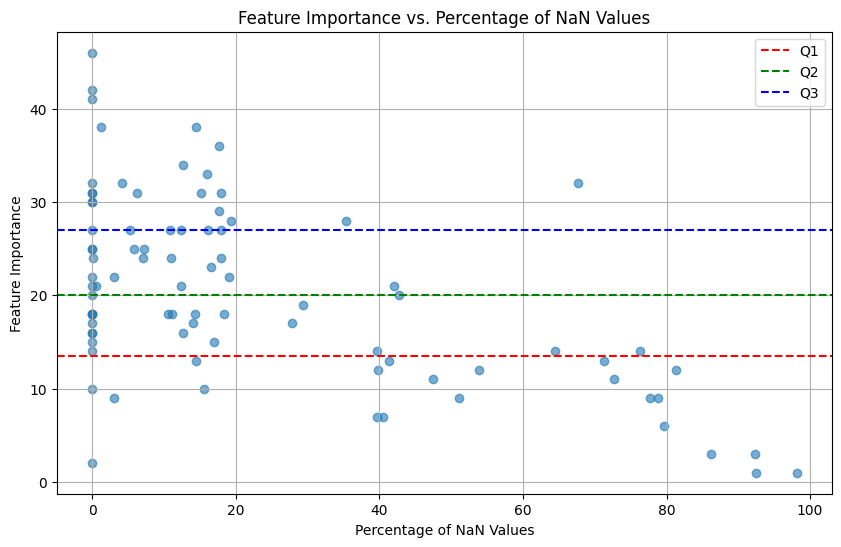

In [39]:
# Calculate quartiles for importance values
q1 = xgb_imp['Importance'].quantile(0.25)
q2 = xgb_imp['Importance'].quantile(0.50)
q3 = xgb_imp['Importance'].quantile(0.75)

# Plot scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(xgb_imp['NaN %'], xgb_imp['Importance'], alpha=0.6)
plt.xlabel('Percentage of NaN Values')
plt.ylabel('Feature Importance')
plt.title('Feature Importance vs. Percentage of NaN Values')
plt.grid(True)

# Draw quartile lines
plt.axhline(y=q1, color='r', linestyle='--', label='Q1')
plt.axhline(y=q2, color='g', linestyle='--', label='Q2')
plt.axhline(y=q3, color='b', linestyle='--', label='Q3')

# Add a legend
plt.legend()
plt.show()

In [40]:
print(f"q1 = {q1}, q2 = {q2}, q3 = {q3}")

q1 = 13.5, q2 = 20.0, q3 = 27.0


## drop cols

In [41]:
cols_to_drop = []
for _, row in xgb_imp.iterrows():
    if row['Importance'] < (q1 + q2)/2 and row['NaN %'] > 50:
        cols_to_drop.append(row['Features'])
cols_to_drop

['f63',
 'f56',
 'f40',
 'f62',
 'f29',
 'f7',
 'f47',
 'f22',
 'f46',
 'f80',
 'f73',
 'f20',
 'f41',
 'f38']

In [42]:
df_dropped = df_imputed.drop(columns=cols_to_drop)

In [43]:
df_dropped

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1.00,1.65,-3.48,0.08,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,-0.72,-0.09,0.06,0.09,-0.72,0.12,1.11,3.31,-0.12,-0.83,-0.07,-1.03,0.33,0.01,-0.07,0.41,-0.41,0.44,0.00,1.40,-1.66,-0.63,-1.60,0.77,0.05,0.79,-0.06,0.00,-1.97,0.20,-0.25,0.22,0.01,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,0.00,1.47,0.00,0.00,-3.11,0.17,-4.00,0.24,0.36,0.50,0.31,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,3.23,0.99,-0.08
1,2.00,2.55,-0.93,0.08,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,-0.72,-0.09,0.08,0.85,-0.76,-0.02,2.01,0.11,-0.12,-0.83,-0.07,-1.03,0.33,0.01,-0.07,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,-1.60,-2.11,0.66,0.96,-0.06,0.00,-1.97,0.20,2.19,0.22,0.01,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,-0.09,-3.61,0.00,0.00,-3.11,0.17,-4.00,0.24,0.36,0.50,0.31,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,3.23,-0.22,0.06
2,3.00,-3.73,0.99,0.08,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,-0.72,-0.09,1.00,0.59,-3.18,-0.71,-2.74,3.03,-0.12,-0.83,-0.07,-1.03,0.33,0.01,-0.07,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,-1.60,0.99,0.67,0.46,-0.06,0.00,-1.97,0.20,-0.13,0.22,0.01,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.22,0.45,0.00,0.00,-1.14,0.17,-4.00,0.24,0.36,0.76,0.31,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,3.23,0.36,0.00
3,4.00,2.12,0.04,0.08,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,-0.72,-0.09,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,-0.83,-0.07,-1.03,0.33,0.01,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,-1.60,0.10,0.81,0.65,-0.06,0.00,-1.97,0.20,-0.49,0.22,0.01,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,-0.05,-0.91,-0.19,-0.28,-2.55,0.17,-4.00,0.24,0.36,0.55,0.31,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,3.23,0.01,-0.03
4,5.00,-0.85,-0.02,0.08,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,-0.72,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,-0.83,-0.07,-1.03,0.33,0.01,0.01,0.09,0.21,0.43,0.00,1.49,1.88,-0.07,-1.60,0.70,0.87,2.47,-0.06,0.00,-1.97,0.20,-0.65,0.22,0.01,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,-0.04,-0.94,-0.19,-0.05,-3.11,0.17,0.06,0.24,0.36,0.34,0.31,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,3.23,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625.00,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,-0.09,0.06,0.18,-2.19,-0.19,1.33,-1.53,-0.12,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,-0.07,-1.41,-1.44,0.05,0.34,0.56,0.25,-1.97,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,0.00,-4.00,0.00,0.01,0.37,0.17,0.00,0.24,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,0.12,0.10,3.48,-0.28,0.00
105438,173659.00,-1.37,0.29,0.08,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,-0.09,0.06,0.18,-1.75,0.09,0.69,0.04,-0.12,-2.43,1.14,-4.00,2.44,-0.18,-0.07,0.25,0.24,0.67,0.00,0.00,2.78,-0.04,-1.60,-0.11,0.05,0.55,-1.46,-0.62,-1.97,0.34,1.89,0.39,-0.12,1.31,-0.05,0.04,-0.00,-0.78,-0.04,-0.78,-0.24,0.00,2.78,0.00,-0.03,0.50,0.17,0.00,0.24,0.12,0.22,0.06,0.17,-0.07,0.19,-1.41,0.06,0.00,0.20,0.12,0.92,1.09,0.98,-0.01
105439,173670.00,0.05,0.34,0.08,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,-0.09,0.06,0.18,-2.17,-0.42,1.29,-1.02,-0.12,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,-0.11,0.05,0.42,-1.32,-0.38,-1.97,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,0.00,1.23,0.00,0.06,0.00,0.17,0.00,0.24,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,0.12,-0.37,3.05,0.38,0.06
105440,173767.00,1.19,0.68,-1.36,0.04,0.00,0.50,1.15,-0.14,-2.14,0.25,4.00,-0.09,0.06,0.18,-0.99,0.62,1.36,-1.90,-0.12,-2.82

## xgboost with dropped df and median impute

In [44]:
X = df_dropped.drop(columns=['row_id', 'target'])
y = df_dropped[['target']]

In [45]:
rest_feats = list(X.columns)
len(rest_feats)

73

In [46]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004158074503013681


In [47]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test_imputed[rest_feats]

# Predict Y_test using the trained linear regression model
y_test = xg_reg.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [48]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_xgb_median_impute_dropped_feats.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_median_impute_dropped_feats.csv


# linear regression with dropped df and median impute

In [49]:
X = df_dropped.drop(columns=['row_id', 'target'])
y = df_dropped[['target']]

In [50]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a LinearRegression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

y_pred = model.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004161715670465956


## transformations for linear regression

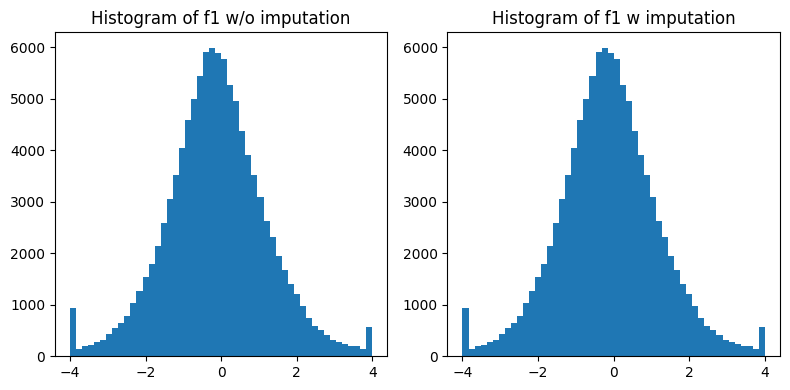

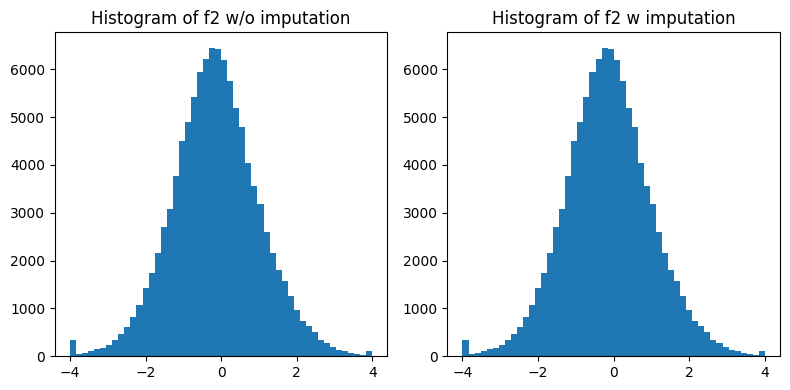

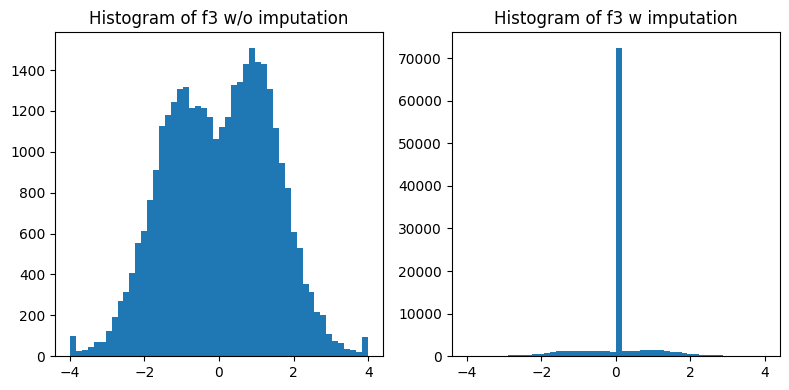

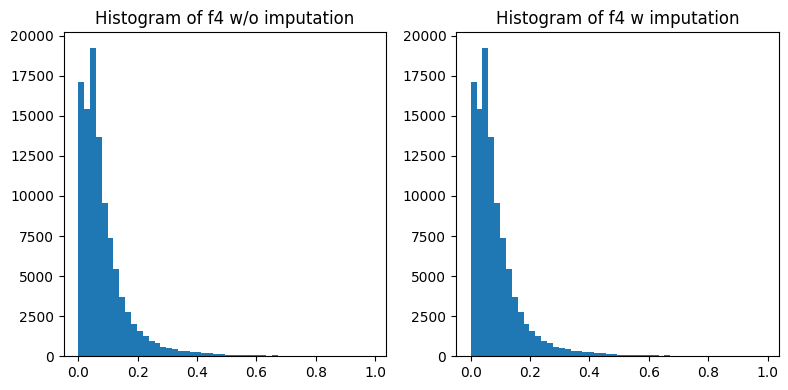

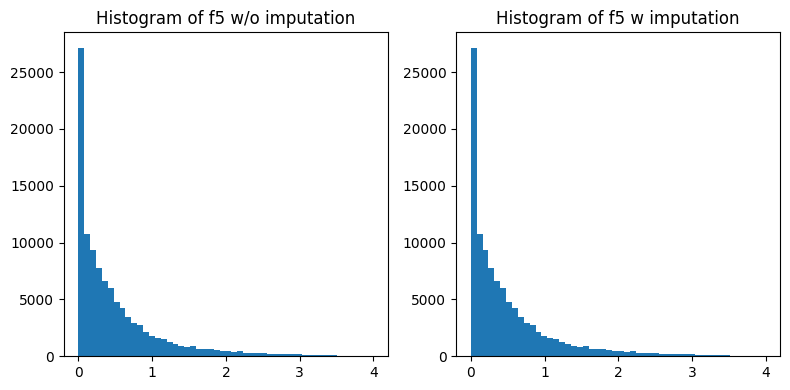

...

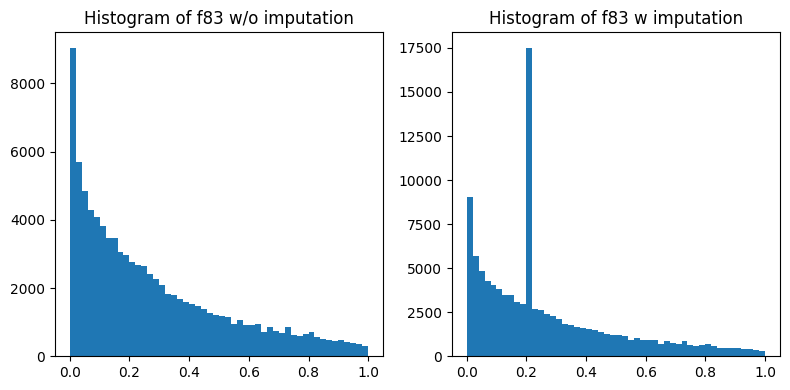

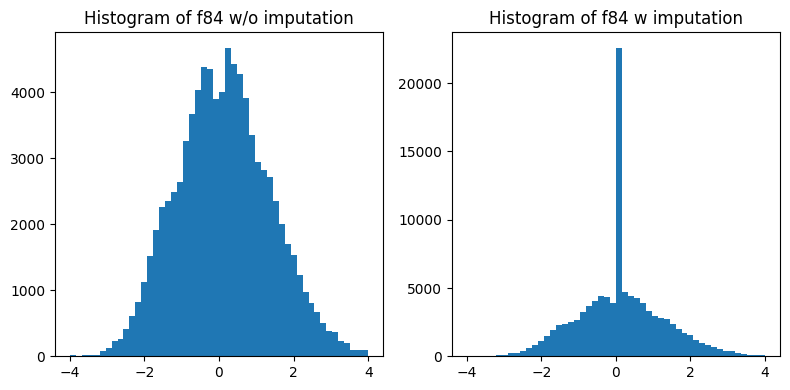

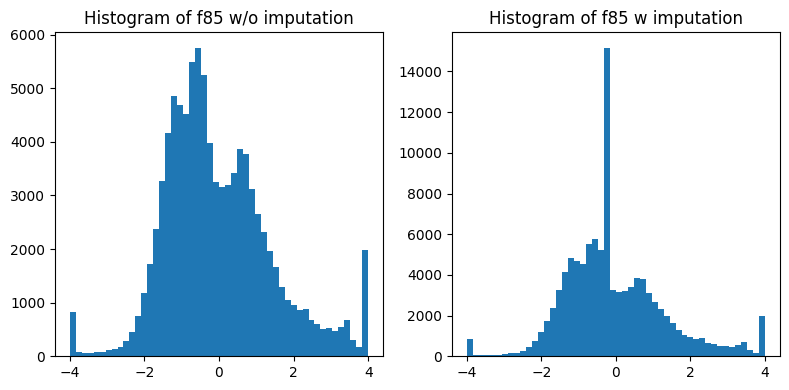

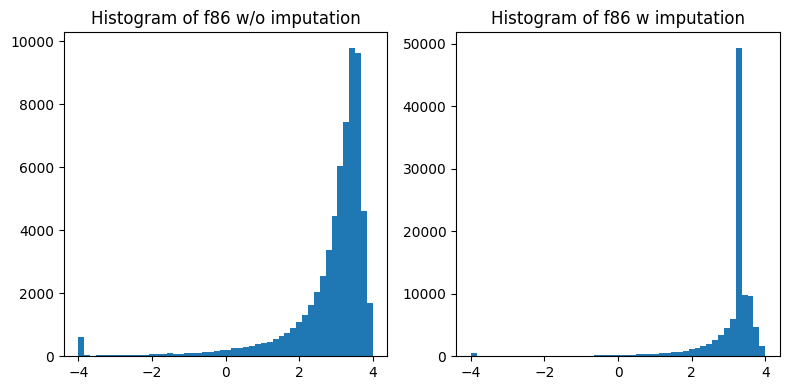

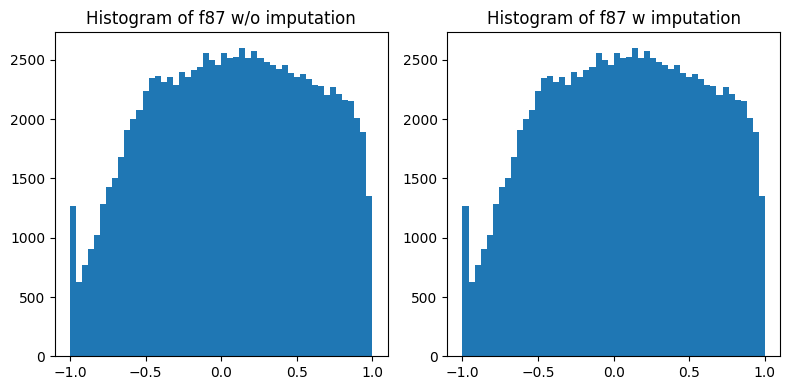

In [51]:
# Loop through each feature in feats
for feature in rest_feats:
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))  
    
    ax[0].hist(df[feature], bins=50)
    ax[0].set_title(f'Histogram of {feature} w/o imputation')

    ax[1].hist(df_dropped[feature], bins=50)
    ax[1].set_title(f'Histogram of {feature} w imputation')
    
    plt.tight_layout()  
    plt.show()
    

# Maybe median impute is not the best

# xgboost with dropped df without median imputation

In [52]:
df_dropped_wo_impute = df.drop(columns=cols_to_drop)
df_dropped_wo_impute

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,0.77,NaN,0.79,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,-2.11,0.66,0.96,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,0.99,0.67,0.46,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,NaN,NaN,NaN,NaN,NaN,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,0.10,0.81,0.65,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,NaN,NaN,NaN,NaN,NaN,0.01,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,0.70,0.87,2.47,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,-1.44,NaN,0.34,0.56,0.25,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,0.55,-1.46,-0.62,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,0.42,-1.32,-0.38,NaN,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,NaN,1.23,NaN,0.06,0.00,NaN,0.00,NaN,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,NaN,-0.37,3.05,0.38,0.06
105440,173767,1.19,0.68,-1.36,0.04,0.00,0.50,1.15,-0.14,-2.14,0.25,4.00,NaN,NaN,NaN,-0.99,0.62,1.36,-1.90,NaN,-2.82,0.14,0.50,-0.45,NaN,-0.16,0.12,0.36,-1.22,1.00,0.10,3.13,NaN,-1.41,-2.29,NaN,0.39,-0.01,0.04,NaN,0.19,1.40,0.33,1.05,-0.64,-3.12,-2.14,-1.02,-0.08,-0.04,-0.78,-0.08,NaN,-2.56,NaN,0.04,0.00,NaN,0.00,NaN,0.50,0.41,0.28,0.10,-1.20,0.19,-0.74,NaN,0.03,0.49,NaN,-0

In [53]:
X = df_dropped_wo_impute.drop(columns=['row_id', 'target'])
y = df_dropped_wo_impute[['target']]

In [54]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.00414692142414937


In [55]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

# df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test[rest_feats]

# Predict Y_test using the trained linear regression model
y_test = xg_reg.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [56]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_xgb_no_impute_dropped_feats.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_no_impute_dropped_feats.csv


## hyperparameter tuning

In [57]:
from sklearn.model_selection import GridSearchCV

# Initialize the model
xg_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Define the parameter grid
param_grid = {
    'colsample_bytree': [0.4],
    'learning_rate': [0.1],
    'max_depth': [3],
    'alpha': [10],
    'n_estimators': [200]
}

# Initialize the Grid Search
grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_grid, scoring='neg_mean_squared_error', cv=3, verbose=1)

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# Train the model with the best parameters
best_xg_reg = grid_search.best_estimator_
y_pred = best_xg_reg.predict(X_val)

# Evaluate the model
mse = mean_squared_error(y_val, y_pred)
print(f"Mean Squared Error after tuning: {mse}")

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters: {'alpha': 10, 'colsample_bytree': 0.4, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Mean Squared Error after tuning: 0.00414555434672254


### Mean Squared Error after tuning: 0.00414555434672254
### Best parameters: {'alpha': 10, 'colsample_bytree': 0.4, 'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}

In [58]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

# df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test[rest_feats]

# Predict Y_test using the trained linear regression model
y_test = best_xg_reg.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [59]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_xgb_tuned_no_impute_dropped_feats.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_tuned_no_impute_dropped_feats.csv


# xgboost with no dropping no impute

In [60]:
X = df.drop(columns=['row_id', 'target'])
y = df[['target']]

In [61]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.00414619116982528


In [62]:
from sklearn.model_selection import GridSearchCV

# Initialize the model
xg_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Define the parameter grid
param_dist = {
    'colsample_bytree': [0.5],
    'learning_rate': [0.1],
    'max_depth': [4],
    'alpha': [10],
    'n_estimators': [200]
}

# Initialize the Grid Search
grid_search = GridSearchCV(estimator=xg_reg, param_grid=param_dist, scoring='neg_mean_squared_error', cv=3, verbose=1)

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# Train the model with the best parameters
best_xg_reg = grid_search.best_estimator_
y_pred = best_xg_reg.predict(X_val)

# Evaluate the model
mse = mean_squared_error(y_val, y_pred)
print(f"Mean Squared Error after tuning: {mse}")

Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters: {'alpha': 10, 'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 200}
Mean Squared Error after tuning: 0.004144974065135843


In [63]:
feature_importance = best_xg_reg.get_booster().get_score(importance_type='weight')

In [64]:
xgb_imp_no_impute = pd.DataFrame({'Features': feature_importance.keys(), 'Importance': feature_importance.values()}).sort_values(by='Importance', ascending=False)
xgb_imp_no_impute

,Features,Importance
82,f84,51.00
80,f82,50.00
23,f24,48.00
15,f16,48.00
7,f8,48.00
62,f64,47.00
57,f59,47.00
22,f23,46.00
1,f2,46.00
14,f15,46.00


In [65]:
xgb_imp_no_impute['NaN %'] = xgb_imp_no_impute['Features'].apply(lambda x: nans[x])
xgb_imp_no_impute

,Features,Importance,NaN %
82,f84,51.00,17.63
80,f82,50.00,18.37
23,f24,48.00,17.71
15,f16,48.00,12.63
7,f8,48.00,12.39
62,f64,47.00,4.21
57,f59,47.00,10.84
22,f23,46.00,16.14
1,f2,46.00,0.00
14,f15,46.00,17.96


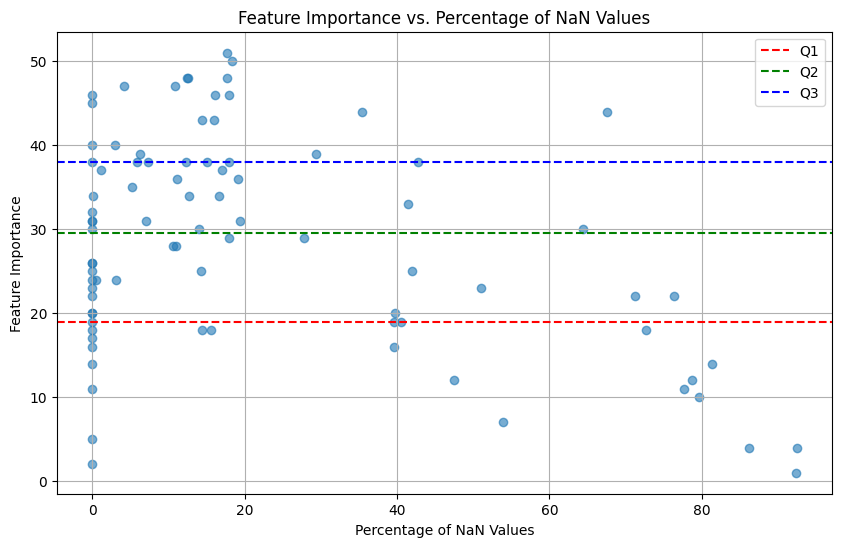

In [66]:
# Calculate quartiles for importance values
q1 = xgb_imp_no_impute['Importance'].quantile(0.25)
q2 = xgb_imp_no_impute['Importance'].quantile(0.50)
q3 = xgb_imp_no_impute['Importance'].quantile(0.75)

# Plot scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(xgb_imp_no_impute['NaN %'], xgb_imp_no_impute['Importance'], alpha=0.6)
plt.xlabel('Percentage of NaN Values')
plt.ylabel('Feature Importance')
plt.title('Feature Importance vs. Percentage of NaN Values')
plt.grid(True)

# Draw quartile lines
plt.axhline(y=q1, color='r', linestyle='--', label='Q1')
plt.axhline(y=q2, color='g', linestyle='--', label='Q2')
plt.axhline(y=q3, color='b', linestyle='--', label='Q3')

# Add a legend
plt.legend()
plt.show()

In [67]:
(q1, q2, q3)

(19.0, 29.5, 38.0)

In [68]:
cols_to_drop_no_impute = []
for _, row in xgb_imp_no_impute.iterrows():
    if row['Importance'] < (q1 + q2)/2 and row['NaN %'] > 50:
        cols_to_drop_no_impute.append(row['Features'])
cols_to_drop_no_impute

['f22',
 'f56',
 'f40',
 'f7',
 'f62',
 'f47',
 'f46',
 'f80',
 'f29',
 'f73',
 'f38',
 'f20']

# xgboost with new drop no impute

In [69]:
df_new_drop_no_impute = df.drop(columns=cols_to_drop_no_impute)
df_new_drop_no_impute

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f41,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,0.77,NaN,NaN,0.79,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,-2.11,NaN,0.66,0.96,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,0.99,NaN,0.67,0.46,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,NaN,NaN,NaN,NaN,NaN,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,0.10,NaN,0.81,0.65,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,NaN,NaN,NaN,NaN,NaN,0.01,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,0.70,NaN,0.87,2.47,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,-1.44,NaN,NaN,0.34,0.56,0.25,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,NaN,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,NaN,0.55,-1.46,-0.62,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,NaN,0.42,-1.32,-0.38,NaN,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,NaN,NaN,1.23,NaN,0.06,0.00,NaN,0.00,NaN,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,NaN,-0.37,3.05,0.38,0.06
105440,173767,1.19,0.68,-1.36,0.04,0.00,0.50,1.15,-0.14,-2.14,0.25,4.00,NaN,NaN,NaN,-0.99,0.62,1.36,-1.90,NaN,-2.82,0.14,0.50,-0.45,NaN,-0.16,0.12,0.36,-1.22,1.00,0.10,3.13,NaN,-1.41,-2.29,NaN,NaN,0.39,-0.01,0.04,NaN,0.19,1.40,0.33,1.05,-0.64,-3.12,-2.14,-1.02,-0.08,-0.04,-0.78,-0.08,NaN,N

In [70]:
X = df_new_drop_no_impute.drop(columns=['row_id', 'target'])
y = df_new_drop_no_impute[['target']]

In [71]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004144750611941534


In [72]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

# df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test.drop(columns=cols_to_drop_no_impute).drop(columns=['row_id'])

# Predict Y_test using the trained linear regression model
y_test = xg_reg.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [73]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_xgb_no_impute_new_dropped_feats.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_no_impute_new_dropped_feats.csv


## correlation matrix

In [74]:
# Compute the correlation matrix
corr_matrix = df_new_drop_no_impute.drop(columns=['row_id', 'target']).corr()

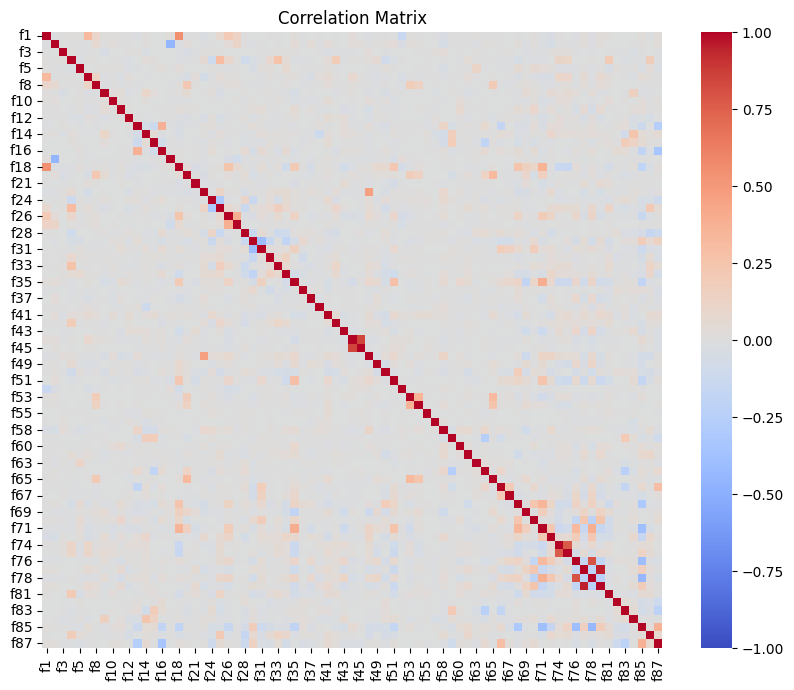

In [75]:
from scipy.cluster import hierarchy
import seaborn as sns

# Plot clustered correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()


In [76]:
corr_matrix

,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f41,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87
f1,1.00,-0.01,0.00,0.01,0.01,0.31,0.10,0.01,0.01,0.00,0.01,-0.02,0.01,-0.00,-0.01,0.02,0.55,0.00,0.00,-0.03,-0.00,0.08,0.21,0.13,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.02,-0.01,-0.01,0.01,-0.01,0.00,-0.00,0.03,-0.01,-0.02,0.00,0.00,-0.01,-0.14,0.01,0.01,-0.00,0.00,-0.03,0.01,0.00,0.01,0.01,0.00,0.01,0.00,-0.00,0.00,-0.01,0.01,-0.01,-0.03,0.01,-0.00,-0.02,0.02,-0.02,0.02,0.01,-0.00,-0.01,-0.01,0.02,-0.01,0.02
f2,-0.01,1.00,-0.00,0.00,0.00,-0.01,0.07,0.00,0.03,0.00,0.00,-0.01,0.01,-0.00,-0.00,-0.46,-0.02,0.03,-0.00,-0.01,0.01,-0.00,0.03,0.11,0.00,-0.02,0.00,-0.00,0.00,-0.00,0.03,-0.01,0.03,-0.01,0.04,0.00,-0.00,0.02,0.02,-0.01,0.01,0.02,0.04,-0.04,0.02,0.01,-0.01,-0.00,-0.05,0.00,0.01,0.01,-0.02,0.01,0.01,0.00,-0.00,0.02,-0.02,0.01,-0.02,-0.05,0.01,0.00,-0.02,0.02,-0.02,0.02,-0.00,-0.01,-0.00,0.00,0.01,-0.01,0.02
f3,0.00,-0.00,1.00,0.01,-0.01,0.00,0.00,-0.04,-0.00,-0.01,0.01,0.01,-0.03,-0.00,-0.01,-0.00,-0.02,-0.04,-0.01,0.01,0.01,0.01,-0.00,-0.00,-0.00,-0.00,0.01,0.00,0.01,0.01,0.01,-0.00,-0.01,0.00,-0.03,0.01,-0.01,-0.01,-0.00,0.03,-0.01,-0.01,-0.00,-0.01,-0.01,0.00,0.00,0.02,0.03,-0.00,0.01,-0.00,0.01,0.00,-0.00,0.00,0.01,-0.00,-0.02,0.00,-0.01,0.01,0.02,0.02,-0.01,-0.00,-0.01,-0.00,0.01,-0.01,0.01,-0.03,0.00,-0.00,-0.01
f4,0.01,0.00,0.01,1.00,-0.03,0.01,0.00,-0.00,0.00,-0.01,-0.03,-0.01,0.03,0.01,-0.00,-0.01,-0.02,-0.01,0.00,0.06,-0.11,0.31,0.09,0.01,-0.10,-0.04,-0.01,0.08,0.26,0.04,-0.01,-0.02,-0.01,-0.00,0.04,0.19,-0.01,0.01,0.00,0.02,0.06,-0.09,-0.03,0.00,-0.00,-0.00,0.00,-0.00,0.01,-0.00,-0.01,0.04,0.00,0.01,0.00,-0.01,-0.01,-0.05,-0.01,-0.02,-0.02,-0.00,0.12,0.10,-0.01,-0.00,0.01,-0.00,0.20,-0.00,-0.02,-0.01,-0.01,0.17,-0.01
f5,0.01,0.00,-0.01,-0.03,1.00,-0.00,0.00,0.01,0.01,0.01,-0.03,-0.01,-0.00,0.00,0.02,0.00,0.03,-0.00,-0.00,-0.00,0.01,0.00,-0.01,0.00,-0.00,-0.04,0.02,0.02,-0.00,0.07,-0.01,0.00,0.00,0.00,0.02,-0.01,-0.01,-0.00,-0.00,-0.01,-0.01,0.02,0.01,-0.00,-0.00,0.00,0.00,-0.00,-0.05,-0.00,0.00,0.01,0.12,-0.01,-0.00,-0.01,-0.01,0.06,0.01,0.06,0.03,0.02,-0.02,-0.02,-0.01,0.01,-0.02,0.01,-0.04,0.02,0.00,0.01,-0.02,0.03,-0.03
f6,0.31,-0.01,0.00,0.01,-0.00,1.00,0.12,-0.02,0.00,-0.03,0.03,-0.00,-0.01,-0.00,-0.01,-0.00,-0.01,-0.04,0.03,-0.08,-0.01,0.03,0.02,0.01,-0.00,-0.00,-0.01,0.01,0.01,0.01,0.02,-0.01,-0.04,0.03,0.06,0.01,-0.01,0.08,0.01,-0.01,-0.03,-0.02,-0.00,-0.04,0.00,-0.01,0.00,0.00,-0.02,0.00,0.00,0.03,0.00,-0.00,0.01,-0.00,0.00,-0.04,0.01,-0.02,-0.04,-0.04,0.11,0.10,-0.01,0.06,-0.02,0.07,0.03,-0.00,0.00,-0.03,0.04,0.01,0.01
f8,0.10,0.07,0.00,0.00,0.00,0.12,1.00,-0.02,0.00,-0.01,0.01,-0.02,-0.01,-0.00,-0.00,-0.02,0.01,0.23,0.01,-0.01,0.01,0.01,0.02,0.03,0.00,-0.01,-0.01,0.01,-0.00,0.01,-0.00,-0.01,0.00,0.00,0.04,0.00,0.00,0.02,0.01,0.00,-0.02,0.01,-0.00,-0.02,0.19,0.15,-0.00,0.00,-0.00,0.00,-0.00,0.01,-0.00,0.00,0.21,-0.01,-0.02,0.01,0.03,0.01,-0.01,-0.02,0.01,0.02,-0.01,0.03,-0.01,0.03,0.02,-0.00,-0.00,-0.01,0.00,0.00,0.00
f9,0.01,0.00,-0.04,-0.00,0.01,-0.02,-0.02,1.00,0.02,0.04,-0.02,-0.01,0.11,0.03,-0.01,0.00,0.01,0.05,-0.00,0.01,0.02,-0.04,-0.00,-0.00,0.01,-0.00,0.00,0.01,0.00,-0.01,-0.05,-0.01,0.00,-0.01,-0.01,-0.02,0.01,0.01,-0.00,-0.04,-0.00,-0.05,0.01,0.01,-0.01,0.00,-0.00,-0.03,-0.01,0.01,0.01,-0.03,-0.01,-0.00,0.00,-0.00,0.01,-0.02,0.06,0.02,-0.01,0.06,0.03,0.06,0.03,-0.01,0.04,-0.02,-0.02,-0.00,-0.01,0.15,-0.02,-0.01,-0.01
f10,0.01,0.03,-0.00,0.00,0.01,0.00,0.00,0.02,1.00,0.01,0.01,-0.00,0.01,-0.00,-0.00,-0.01,-0.01,-0.01,-0.00,-0.00,0.00,-0.01,-0.00,0.01,-0.01,0.02,-0.01,0.00,0.02,0.00,-0.03,-0.01,-0.03,-0.01,0.05,0.00,-0.01,0.00,-0.00,0.04,0.00,0.02,-0.02,-0.00,-0.00,-0.01,-0.01,0.00,-0.01,-0.00,0.04,0.00,-0.00,0.00,-0.01,-0.01,-0.00,-0.01,-0.02,0.02,-0.03,-0.02,0.04,0.04,-0.02,-0.00,-0.02,-0.00,0.03,-0.01,0.01,

In [77]:
corr_matrix.to_csv('corr_matrix.csv')

In [78]:
threshold = 0.8

# Find pairs of highly correlated features
high_corr_pairs = [(feature1, feature2, corr_matrix.loc[feature1, feature2])
                   for feature1 in corr_matrix.columns 
                   for feature2 in corr_matrix.columns 
                   if feature1 != feature2 and abs(corr_matrix.loc[feature1, feature2]) > threshold]

# Display highly correlated pairs
high_corr_pairs

[('f44', 'f45', 0.8496947060205254),
 ('f45', 'f44', 0.8496947060205254),
 ('f76', 'f78', 0.8012811275932767),
 ('f77', 'f79', 0.9488068312182714),
 ('f78', 'f76', 0.8012811275932767),
 ('f79', 'f77', 0.9488068312182714)]

## xgboost no impute more dropped using corr_matrix

In [79]:
X = df_new_drop_no_impute.drop(columns=['row_id', 'f44', 'f78', 'f79', 'target'])
y = df_new_drop_no_impute[['target']]

In [80]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004144225486120989


In [81]:
# Load Test Dataset
df_test = pd.read_csv("/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv")
print("df_test.shape:", df_test.shape)

# df_test_imputed = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns)

# Prepare X_test matrix
X_test = df_test.drop(columns=cols_to_drop_no_impute).drop(columns=['row_id', 'f44', 'f78', 'f79'])

# Predict Y_test using the trained regression model
y_test = xg_reg.predict(X_test)

print("\nGenerating Predictions: Success")

df_test.shape: (85821, 88)

Generating Predictions: Success


In [82]:
# Create DataFrame for predictions
df_output = pd.DataFrame({"row_id": np.array(df_test['row_id']), 'target': np.array(y_test.reshape(-1))})

# Define filename for saving predictions
filename = "predictions_xgb_no_impute_corr_dropped_feats.csv"

# Save predictions to CSV file
df_output.to_csv(filename, index=False)

print(f"Successfully Saved in File: {filename}")

Successfully Saved in File: predictions_xgb_no_impute_corr_dropped_feats.csv


# ***CHECK***

In [133]:
from sklearn.model_selection import GridSearchCV

# Initialize the model
xgb_reg = xgb.XGBRegressor(objective='reg:squarederror')

# Define the parameter grid
param_dist = {
    'colsample_bytree': [0.2, 0.3, 0.4, 0.5],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6],
    'alpha': [0, 1, 10],
    'n_estimators': [50, 100, 200]
}

# Initialize the Grid Search
grid_search = GridSearchCV(estimator=xgb_reg, param_grid=param_dist, scoring='neg_mean_squared_error', cv=3, verbose=1)

# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# Train the model with the best parameters
best_xg_reg = grid_search.best_estimator_
y_pred = best_xg_reg.predict(X_val)

# Evaluate the model
mse = mean_squared_error(y_val, y_pred)
print(f"Mean Squared Error after tuning: {mse}")

Fitting 3 folds for each of 432 candidates, totalling 1296 fits
Best parameters: {'alpha': 10, 'colsample_bytree': 0.5, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100}
Mean Squared Error after tuning: 0.004146087840346316


# checking relation bw row_id and target

In [83]:
df

,row_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,NaN,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,NaN,0.77,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,NaN,0.72,0.62,-1.01,-0.97,0.02,NaN,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,NaN,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,NaN,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,NaN,-2.11,NaN,NaN,0.66,0.96,NaN,NaN,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,NaN,0.91,-0.97,-0.77,-0.97,0.02,NaN,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,NaN,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,NaN,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,NaN,0.99,NaN,NaN,0.67,0.46,NaN,NaN,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,NaN,1.52,0.68,-0.85,0.37,0.02,NaN,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,NaN,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,NaN,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,0.93,-0.98,-0.04,NaN,NaN,NaN,NaN,NaN,-0.09,NaN,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,NaN,0.10,NaN,NaN,0.81,0.65,NaN,NaN,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,NaN,1.41,0.02,2.46,-0.97,0.02,-1.61,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,NaN,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,NaN,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,1.71,0.42,-0.83,NaN,NaN,NaN,NaN,NaN,0.01,NaN,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,NaN,0.70,NaN,NaN,0.87,2.47,NaN,NaN,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,NaN,0.93,0.90,-1.49,0.40,0.02,NaN,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,NaN,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-3.97,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,NaN,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,NaN,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,NaN,-1.44,-1.19,NaN,NaN,0.34,0.56,0.25,NaN,NaN,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,NaN,-0.87,0.24,-0.04,-0.97,0.24,NaN,NaN,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,-1.33,0.42,0.28,0.08,0.13,0.19,-0.80,NaN,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,NaN,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,NaN,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,0.52,NaN,NaN,0.55,-1.46,-0.62,NaN,NaN,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,NaN,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,1.80,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,NaN,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,NaN,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,NaN,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,0.47,NaN,NaN,0.42,-1.32,-0.38,-0.50

In [84]:
df['row_id'][:70]

0       1
1       2
2       3
3       4
4       5
5       6
6       7
7       8
8       9
9      10
10     11
11     12
12     13
13     14
14     15
15     16
16     17
17     18
18     19
19     20
20     21
21     22
22     23
23     24
24     25
25     26
26     27
27     28
28     29
29     30
30     31
31     32
32     33
33     34
34     35
35     36
36     37
37     38
38     39
39     40
40     41
41     42
42     43
43     74
44     75
45     76
46     77
47     78
48     79
49     80
50     81
51     82
52     83
53     84
54     85
55     86
56     87
57     88
58     89
59     90
60     91
61     92
62     93
63     94
64     95
65     96
66     97
67     98
68     99
69    100
Name: row_id, dtype: int64

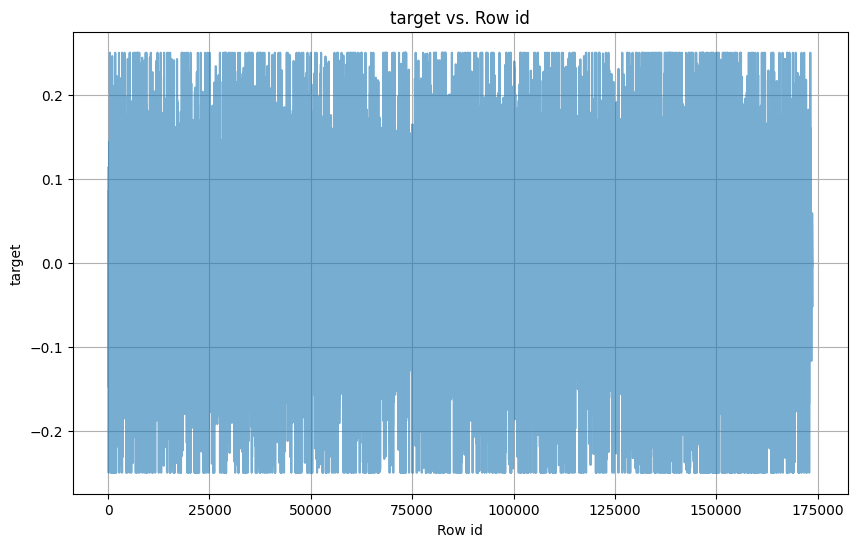

In [85]:
plt.figure(figsize=(10, 6))
plt.plot(df['row_id'], df['target'], alpha=0.6)
plt.xlabel('Row id')
plt.ylabel('target')
plt.title('target vs. Row id')
plt.grid(True)
plt.show()

# trying time series forecasting

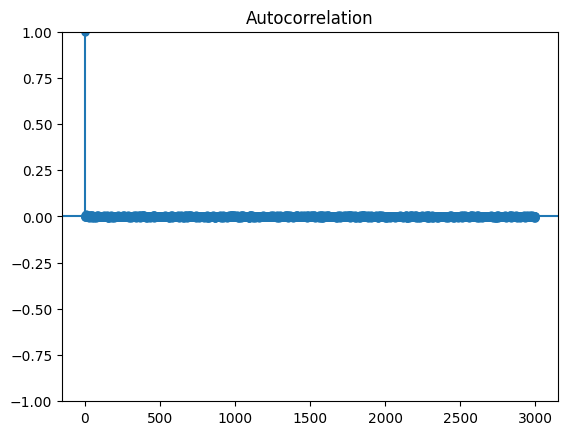

In [86]:
from statsmodels.graphics.tsaplots import plot_acf

# Plot autocorrelation for the target feature
plot_acf(df['target'], lags=3000)
plt.show()

# taking temporal aspect into account

In [87]:
df_test = pd.read_csv('/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Test_Kaggle.csv')
df_test

,row_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87
0,44,-0.87,0.39,1.80,0.18,0.03,0.11,0.22,0.03,-1.02,-2.49,-1.87,-0.44,-0.07,0.85,1.18,-1.04,0.24,1.12,1.10,NaN,NaN,-0.40,-0.70,-0.02,1.01,-0.63,-0.44,0.08,0.01,0.11,0.00,0.83,2.00,1.61,2.78,-0.03,-1.33,-0.83,-0.05,0.18,-0.67,-0.89,-1.95,0.06,0.02,0.66,0.47,-2.36,0.06,1.74,0.26,-0.22,0.34,-0.45,3.52,0.00,1.07,0.97,-1.90,0.27,0.62,NaN,0.00,-0.03,-1.81,-0.05,0.08,-0.40,0.26,-0.13,0.18,0.22,-2.27,0.47,0.39,0.13,-2.02,0.25,-2.01,-0.70,0.11,0.00,0.12,1.17,-0.96,3.70,0.05
1,45,-1.07,-0.00,2.83,0.10,0.07,0.26,NaN,NaN,0.71,-1.41,-1.72,0.54,0.49,0.77,-0.12,-0.49,0.77,1.12,-0.11,NaN,NaN,-1.01,0.27,0.66,-1.44,-0.95,-0.40,-0.12,-0.15,0.10,0.01,0.91,0.00,1.55,3.30,-0.03,-2.00,0.63,-0.03,-0.76,-1.69,-0.89,-0.89,-0.47,0.06,-2.31,-0.98,-2.44,0.06,0.96,0.29,0.01,1.07,0.89,-1.82,NaN,0.34,0.87,1.41,1.00,0.33,NaN,0.01,0.00,0.91,0.14,0.00,-0.54,0.18,-0.06,0.50,0.41,-2.46,0.48,0.64,0.12,-1.65,0.28,-1.65,1.38,0.12,0.00,0.13,0.87,-0.70,3.72,0.20
2,46,-0.61,0.99,-2.31,0.16,0.40,0.05,-3.01,-1.50,0.36,-2.20,0.16,0.39,0.42,0.25,-0.64,-0.58,-0.54,1.21,1.96,NaN,1.37,1.72,0.62,0.42,-0.97,0.37,-0.49,-0.12,-0.27,0.09,0.02,0.86,1.00,1.65,3.11,-0.05,-2.93,-1.71,-0.85,-1.51,0.13,-0.89,-1.19,-0.14,-0.07,-3.61,-3.59,-2.17,0.13,2.11,0.13,0.86,0.00,1.92,-0.28,NaN,0.85,0.33,-1.98,-0.87,0.17,NaN,0.03,0.06,-2.62,0.12,0.06,-0.34,0.25,0.23,1.00,0.19,-1.71,0.52,0.36,0.15,1.20,0.31,1.11,-0.57,0.12,0.00,0.09,1.03,-0.53,3.79,0.11
3,47,2.63,-0.34,0.48,0.15,0.10,-0.02,NaN,1.71,0.77,-1.29,-0.95,0.80,0.44,1.28,0.25,-0.55,-0.05,1.48,1.34,NaN,0.41,1.06,1.63,0.22,-0.27,1.84,0.32,-0.20,-0.06,0.09,0.02,0.82,2.00,1.74,0.52,-0.05,-2.64,NaN,0.64,-0.23,-0.01,-0.89,1.37,0.05,0.06,1.78,1.23,-1.73,0.24,0.20,0.86,0.57,2.80,3.11,-3.19,NaN,1.97,1.00,0.77,1.00,0.62,NaN,0.59,0.08,2.35,0.09,-0.05,-1.03,0.39,0.00,0.86,0.29,-2.36,0.31,0.43,0.12,-0.47,0.23,-0.48,2.23,0.11,0.00,0.10,1.97,-0.51,3.64,0.08
4,48,0.66,-0.85,-0.98,0.18,1.15,0.48,NaN,0.50,-0.62,-0.58,-2.57,-1.06,NaN,0.30,0.63,-0.97,0.00,1.05,-0.53,NaN,-0.34,-0.43,-0.75,-0.17,0.64,0.80,0.24,-0.11,0.43,0.08,0.03,0.82,0.00,0.95,1.94,-0.05,-2.40,NaN,-0.36,-0.66,0.80,0.13,-1.47,0.91,0.12,-0.03,-0.03,-1.24,0.39,1.63,0.24,0.15,-2.50,-1.39,3.03,NaN,1.50,0.62,1.33,-0.84,-0.21,NaN,NaN,0.02,0.02,0.07,0.05,-0.25,0.24,-0.41,2.52,0.33,-2.27,0.35,0.32,0.13,-1.31,0.26,-1.33,NaN,0.39,0.00,0.13,2.22,-0.68,3.72,0.18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85816,191259,-0.37,-0.35,-0.40,0.09,0.65,0.47,NaN,0.00,-0.32,-2.56,-2.19,-0.55,NaN,NaN,-0.22,-3.58,-0.16,0.88,1.93,NaN,NaN,0.58,-0.45,0.62,-1.36,-0.13,-0.49,-0.16,0.27,0.32,-0.11,-1.10,1.00,0.04,2.88,-0.02,-1.33,-0.71,-3.46,0.53,1.29,-0.12,0.42,-0.09,-0.12,NaN,NaN,-1.87,0.09,2.94,0.30,0.61,1.11,-1.13,-3.27,NaN,1.10,0.52,2.14,-0.46,-0.02,NaN,0.00,NaN,1.13,NaN,0.11,0.22,NaN,-0.03,NaN,0.12,-0.79,0.26,0.49,0.07,0.71,0.15,0.45,NaN,0.02,0.00,0.78,0.49,2.27,3.49,0.55
85817,191260,0.75,1.22,NaN,0.02,0.14,-0.21,NaN,1.58,-0.04,-2.82,-1.76,-1.96,NaN,NaN,NaN,-1.22,-0.82,0.44,4.00,NaN,NaN,NaN,0.20,0.14,-0.80,1.25,0.44,-0.06,0.31,0.11,0.10,-1.00,1.00,0.05,1.38,-0.02,-2.00,-0.70,1.71,NaN,NaN,-0.56,-0.57,-0.50,-0.03,NaN,NaN,-2.20,0.11,1.97,0.95,-0.61,-0.70,1.64,-0.36,NaN,-1.83,-0.97,-0.28,0.94,0.14,2.04,0.03,NaN,4.00,NaN,-0.19,0.56,NaN,-0.07,NaN,0.16,-1.58,0.30,0.37,0.06,-0.15,0.14,-0.10,-0.89,0.13,0.00,0.48,NaN,2.11,2.94,-0.10
85818,191261,-0.04,0.39,-0.86,0.05,0.07,-0.03,N

In [88]:
test_row_id = list(df_test['row_id'])
test_row_id

[44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66,
 67,
 68,
 69,
 70,
 71,
 72,
 73,
 146,
 147,
 148,
 149,
 150,
 151,
 152,
 153,
 154,
 155,
 156,
 157,
 158,
 159,
 160,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 353,
 354,
 355,
 356,
 357,
 358,
 359,
 360,
 361,
 362,
 363,
 364,
 365,
 366,
 367,
 368,
 369,
 370,
 371,
 372,
 373,
 374,
 375,
 376,
 377,
 378,
 379,
 380,
 381,
 382,
 400,
 401,
 402,
 403,
 404,
 447,
 448,
 449,
 450,
 451,
 452,
 453,
 454,
 455,
 456,
 457,
 458,
 459,
 460,
 461,
 462,
 463,
 464,
 465,
 466,
 467,
 468,
 469,
 470,
 471,
 515,
 516,
 517,
 518

In [107]:
def slice_(df, start_id, end_id):
    sliced_df = df[(df['row_id'] >= start_id) & (df['row_id'] <= end_id)]
    return sliced_df

In [117]:
train_list = []
test_list = []

train_list.append(slice_(df_new_drop_no_impute, 1, 43))

In [118]:
l = 44
for i in range(1, len(test_row_id)):
    if test_row_id[i] - test_row_id[i - 1] != 1:
        test_list.append(slice_(df_test, l, i - 1))
        l = i
        train_list.append(slice_(df_new_drop_no_impute, test_row_id[i - 1] + 1, test_row_id[i] - 1))
        print(f"till row {test_row_id[i - 1]} done!")
test_list.append(slice_(df_test, l, test_row_id[-1]))

till row 73 done!
till row 160 done!
till row 236 done!
till row 309 done!
till row 382 done!
till row 404 done!
till row 471 done!
till row 521 done!
till row 588 done!
till row 661 done!
till row 719 done!
till row 766 done!
till row 845 done!
till row 918 done!
till row 989 done!
till row 993 done!
till row 1067 done!
till row 1134 done!
till row 1207 done!
till row 1225 done!
till row 1280 done!
till row 1353 done!
till row 1408 done!
till row 1484 done!
till row 1577 done!
till row 1617 done!
till row 1690 done!
till row 1729 done!
till row 1823 done!
till row 1863 done!
till row 1947 done!
till row 2006 done!
till row 2085 done!
till row 2159 done!
till row 2203 done!
till row 2276 done!
till row 2365 done!
till row 2438 done!
till row 2529 done!
till row 2601 done!
till row 2640 done!
till row 2782 done!
till row 2794 done!
till row 2868 done!
till row 2937 done!
till row 3010 done!
till row 3079 done!
till row 3154 done!
till row 3240 done!
till row 3291 done!
till row 3338 don

In [120]:
len(train_list)

3122

In [88]:
df_new_drop_no_impute

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f41,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,0.77,NaN,NaN,0.79,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,-2.11,NaN,0.66,0.96,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,0.99,NaN,0.67,0.46,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,NaN,NaN,NaN,NaN,NaN,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,0.10,NaN,0.81,0.65,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,NaN,NaN,NaN,NaN,NaN,0.01,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,0.70,NaN,0.87,2.47,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,-1.44,NaN,NaN,0.34,0.56,0.25,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,NaN,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,NaN,0.55,-1.46,-0.62,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,NaN,0.42,-1.32,-0.38,NaN,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,NaN,NaN,1.23,NaN,0.06,0.00,NaN,0.00,NaN,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,NaN,-0.37,3.05,0.38,0.06
105440,173767,1.19,0.68,-1.36,0.04,0.00,0.50,1.15,-0.14,-2.14,0.25,4.00,NaN,NaN,NaN,-0.99,0.62,1.36,-1.90,NaN,-2.82,0.14,0.50,-0.45,NaN,-0.16,0.12,0.36,-1.22,1.00,0.10,3.13,NaN,-1.41,-2.29,NaN,NaN,0.39,-0.01,0.04,NaN,0.19,1.40,0.33,1.05,-0.64,-3.12,-2.14,-1.02,-0.08,-0.04,-0.78,-0.08,NaN,N

In [89]:
df_new_drop_no_impute.to_csv('df_new_drop_no_impute.csv')

In [123]:
def apply_xgb(train, test):
    X_train = train.drop(columns=['row_id', 'f44', 'f78', 'f79', 'target'])
    y_train = train[['target']]
    
    xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

    xg_reg.fit(X_train, y_train)
    
    X_test = test.drop(columns=cols_to_drop_no_impute).drop(columns=['row_id', 'f44', 'f78', 'f79'])

    y_test = xg_reg.predict(X_test)
    
    df_output = pd.DataFrame({"row_id": np.array(test['row_id']), 'target': np.array(y_test.reshape(-1))})
    
    return df_output

In [124]:
output_list = []

for i in range(len(train_list)):
    output = apply_xgb(train_list[i], test_list[i])
    output_list.append(output)
    print(f"{i + 1}/{len(train_list)} done!")

df_output = pd.concat(output_list, ignore_index=True)
df_output.to_csv('divided_wo_already_predicted.csv', index=False)

1/3122 done!
2/3122 done!
3/3122 done!
4/3122 done!
5/3122 done!
6/3122 done!
7/3122 done!
8/3122 done!
9/3122 done!
10/3122 done!
11/3122 done!
12/3122 done!
13/3122 done!
14/3122 done!
15/3122 done!
16/3122 done!
17/3122 done!
18/3122 done!
19/3122 done!
20/3122 done!
21/3122 done!
22/3122 done!
23/3122 done!
24/3122 done!
25/3122 done!
26/3122 done!
27/3122 done!
28/3122 done!
29/3122 done!
30/3122 done!
31/3122 done!
32/3122 done!
33/3122 done!
34/3122 done!
35/3122 done!
36/3122 done!
37/3122 done!
38/3122 done!
39/3122 done!
40/3122 done!
41/3122 done!
42/3122 done!
43/3122 done!
44/3122 done!
45/3122 done!
46/3122 done!
47/3122 done!
48/3122 done!
49/3122 done!
50/3122 done!
51/3122 done!
52/3122 done!
53/3122 done!
54/3122 done!
55/3122 done!
56/3122 done!
57/3122 done!
58/3122 done!
59/3122 done!
60/3122 done!
61/3122 done!
62/3122 done!
63/3122 done!
64/3122 done!
65/3122 done!
66/3122 done!
67/3122 done!
68/3122 done!
69/3122 done!
70/3122 done!
71/3122 done!
72/3122 done!
7

In [125]:
df_output

,row_id,target
0,44,-0.01
1,45,0.01
2,46,0.01
3,47,0.01
4,48,0.01
...,...,...
85816,191259,-0.05
85817,191260,-0.05
85818,191261,-0.05
85819,191262,-0.05


# spline interpolation

In [114]:
sample = pd.DataFrame({'f2': np.array(df_new_drop_no_impute['f2']), 'target': np.array(df_new_drop_no_impute['target'])}).sort_values(by='f2') 
sample

,f2,target
640,-4.00,0.04
62790,-4.00,-0.02
45690,-4.00,-0.07
81315,-4.00,-0.00
90133,-4.00,-0.02
...,...,...
95808,4.00,0.03
20695,4.00,-0.01
4771,4.00,0.04
67608,4.00,-0.02


In [115]:
X = np.array(sample['f2']) 
y = np.array(sample['target'])

In [116]:
int(len(X)*0.2)

21088

In [117]:
range_start = 0
range_end = len(X)
num_samples = int(len(X)*0.2)

val_idx = np.array(sorted(np.random.choice(range(range_start, range_end + 1), num_samples, replace=False)))
val_idx

array([    19,     22,     31, ..., 105409, 105411, 105420])

In [118]:
X_val = X[val_idx]
y_val = y[val_idx]

In [119]:
mask = np.ones(len(X), dtype=bool)
mask[val_idx] = False

X_train = X[mask]
y_train = y[mask]

In [120]:
X_train

array([-4.      , -4.      , -4.      , ...,  4.000001,  4.000001,
        4.000001])

In [ ]:
from scipy.interpolate import splrep, splev

# Fit a spline
tck = splrep(X_train, y_train)

y_pred = splev(X_val, tck) 

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

# knn imputation

In [122]:
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=5)
data_imputed = imputer.fit_transform(df_new_drop_no_impute)


In [89]:
df_new_drop_no_impute

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f41,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,0.77,NaN,NaN,0.79,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,-2.11,NaN,0.66,0.96,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,0.99,NaN,0.67,0.46,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,NaN,NaN,NaN,NaN,NaN,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,0.10,NaN,0.81,0.65,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,NaN,NaN,NaN,NaN,NaN,0.01,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,0.70,NaN,0.87,2.47,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,-1.44,NaN,NaN,0.34,0.56,0.25,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,NaN,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,NaN,0.55,-1.46,-0.62,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,NaN,0.42,-1.32,-0.38,NaN,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,NaN,NaN,1.23,NaN,0.06,0.00,NaN,0.00,NaN,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,NaN,-0.37,3.05,0.38,0.06
105440,173767,1.19,0.68,-1.36,0.04,0.00,0.50,1.15,-0.14,-2.14,0.25,4.00,NaN,NaN,NaN,-0.99,0.62,1.36,-1.90,NaN,-2.82,0.14,0.50,-0.45,NaN,-0.16,0.12,0.36,-1.22,1.00,0.10,3.13,NaN,-1.41,-2.29,NaN,NaN,0.39,-0.01,0.04,NaN,0.19,1.40,0.33,1.05,-0.64,-3.12,-2.14,-1.02,-0.08,-0.04,-0.78,-0.08,NaN,N

In [126]:
data_imputed

array([[ 1.00000000e+00,  1.64738660e+00, -3.47984200e+00, ...,
         3.73705116e+00,  9.90363100e-01, -7.78560400e-02],
       [ 2.00000000e+00,  2.55057000e+00, -9.34679400e-01, ...,
         3.73705116e+00, -2.19665290e-01,  6.01491630e-02],
       [ 3.00000000e+00, -3.73033640e+00,  9.90840700e-01, ...,
         3.73705116e+00,  3.61992600e-01,  5.18546700e-04],
       ...,
       [ 1.73670000e+05,  4.58181430e-02,  3.42770460e-01, ...,
         3.04939480e+00,  3.76071930e-01,  5.89763260e-02],
       [ 1.73767000e+05,  1.19465300e+00,  6.84375940e-01, ...,
         3.48917900e+00, -7.87260060e-01,  2.26959350e-03],
       [ 1.73799000e+05, -8.99137200e-01,  1.19063530e+00, ...,
         3.44130230e+00, -6.75373100e-02, -5.15900700e-02]])

In [127]:
df_new_drop_knn_impute = pd.DataFrame(data_imputed, columns=df_new_drop_no_impute.columns)
df_new_drop_knn_impute

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f41,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1.00,1.65,-3.48,-0.23,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,-1.00,0.30,0.29,0.09,-0.72,0.12,1.11,3.31,-0.24,-0.08,-0.22,-0.64,-0.08,-0.03,-0.17,0.41,-0.41,0.44,0.00,1.52,-1.66,-0.63,-1.36,0.77,-0.45,0.71,0.79,0.05,-0.06,-2.25,0.14,-0.25,0.16,-0.34,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,0.02,0.08,1.47,-0.08,0.00,-3.11,0.18,-4.00,-2.00,0.14,0.50,0.45,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,3.74,0.99,-0.08
1,2.00,2.55,-0.93,-0.34,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,-1.12,0.67,0.08,0.85,-0.76,-0.02,2.01,0.11,-0.31,-0.08,-0.16,-0.64,-0.08,-0.03,-0.14,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,-1.50,-2.11,-0.45,0.66,0.96,0.05,-0.06,-1.66,0.14,2.19,0.17,-0.34,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,0.01,-0.09,-3.61,-0.11,0.00,-3.11,0.19,-4.00,-2.00,0.14,0.50,0.52,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,3.74,-0.22,0.06
2,3.00,-3.73,0.99,0.04,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,-1.00,0.50,1.00,0.59,-3.18,-0.71,-2.74,3.03,-0.24,-0.49,-0.22,-0.65,0.42,-0.00,-0.17,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,-1.50,0.99,-0.45,0.67,0.46,0.05,-0.06,-2.25,0.14,-0.13,0.16,-0.20,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.11,0.22,0.45,-0.08,0.00,-1.14,0.18,-4.00,-1.88,0.08,0.76,0.45,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,3.74,0.36,0.00
3,4.00,2.12,0.04,0.31,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,-1.00,0.30,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,-0.20,-0.22,-0.63,0.49,-0.11,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,-1.50,0.10,-0.45,0.81,0.65,-0.05,-0.05,-2.25,0.19,-0.49,0.16,-0.39,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,0.18,-4.00,-1.58,0.14,0.55,0.45,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,3.62,0.01,-0.03
4,5.00,-0.85,-0.02,0.04,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,-1.00,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,-0.03,-0.22,-0.98,0.07,-0.19,0.01,0.09,0.21,0.43,0.00,1.49,1.88,-0.03,-1.50,0.70,-0.45,0.87,2.47,0.05,-0.06,-2.25,0.14,-0.65,0.16,-0.27,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,0.18,0.06,-1.63,0.12,0.34,0.45,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,3.74,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625.00,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,-0.69,-0.21,0.08,-2.19,-0.19,1.33,-1.53,0.25,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,0.02,-1.41,-1.44,-0.75,-0.73,0.34,0.56,0.25,-1.18,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,0.22,0.05,-4.00,0.00,0.01,0.37,0.23,0.00,-0.29,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,1.00,0.10,3.48,-0.28,0.00
105438,173659.00,-1.37,0.29,-0.18,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,-0.69,-0.21,0.08,-1.78,0.09,0.69,0.04,0.25,-2.43,1.14,-4.00,2.44,-0.18,-0.13,0.25,0.24,0.02,0.00,0.00,2.78,-0.04,-1.77,-0.83,-0.75,-0.73,0.55,-1.46,-0.62,-1.18,0.34,1.89,0.39,-0.12,1.31,-0.05,-0.65,-0.66,-0.78,0.40,-0.78,-0.24,0.22,0.05,2.78,0.00,-0.03,0.50,0.23,0.00,-0.18,0.12,0.22,0.06,0.09,-0.71,0.19,-1.41,0.18,0.01,0.25,1.00,0.92,1.09,0.98,-0.01
105439,173670.00,0.05,0.34,-0.18,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,-0.69,-0.21,0.08,-2.17,-0.42,1.29,-1.02,0.25,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,-1.20,-0.75,-0.73,0.42,-1.32,-0.38,-1.18,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,0.22,0.05,1.23,0.00,0.06,0.00,0.23,0.00,-0.29,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,1.00,-0.37,3.05,0.38

In [128]:
df_new_drop_knn_impute.to_csv('df_new_drop_knn_impute.csv')

In [90]:
df_new_drop_knn_impute = pd.read_csv('/kaggle/input/df-new-drop-knn-impute/df_new_drop_knn_impute.csv').drop(columns=['Unnamed: 0'])

In [91]:
df_new_drop_knn_impute

,row_id,f1,f2,f3,f4,f5,f6,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f21,f23,f24,f25,f26,f27,f28,f30,f31,f32,f33,f34,f35,f36,f37,f39,f41,f42,f43,f44,f45,f48,f49,f50,f51,f52,f53,f54,f55,f57,f58,f59,f60,f61,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f74,f75,f76,f77,f78,f79,f81,f82,f83,f84,f85,f86,f87,target
0,1.00,1.65,-3.48,-0.23,0.12,0.22,0.20,-0.29,-0.36,-1.88,-2.82,-1.00,0.30,0.29,0.09,-0.72,0.12,1.11,3.31,-0.24,-0.08,-0.22,-0.64,-0.08,-0.03,-0.17,0.41,-0.41,0.44,0.00,1.52,-1.66,-0.63,-1.36,0.77,-0.45,0.71,0.79,0.05,-0.06,-2.25,0.14,-0.25,0.16,-0.34,0.39,2.82,3.52,0.72,0.62,-1.01,-0.97,0.02,0.02,0.08,1.47,-0.08,0.00,-3.11,0.18,-4.00,-2.00,0.14,0.50,0.45,0.26,-2.20,0.66,-2.20,0.03,0.01,0.30,-0.14,-1.95,3.74,0.99,-0.08
1,2.00,2.55,-0.93,-0.34,0.17,0.27,0.08,-0.40,-0.54,-1.87,1.22,-1.12,0.67,0.08,0.85,-0.76,-0.02,2.01,0.11,-0.31,-0.08,-0.16,-0.64,-0.08,-0.03,-0.14,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,-1.50,-2.11,-0.45,0.66,0.96,0.05,-0.06,-1.66,0.14,2.19,0.17,-0.34,-1.22,-0.22,-3.60,0.91,-0.97,-0.77,-0.97,0.02,0.01,-0.09,-3.61,-0.11,0.00,-3.11,0.19,-4.00,-2.00,0.14,0.50,0.52,0.24,-0.80,0.57,-0.81,0.16,0.00,0.19,1.18,0.12,3.74,-0.22,0.06
2,3.00,-3.73,0.99,0.04,0.15,0.16,0.40,-0.66,1.51,-1.66,-0.90,-1.00,0.50,1.00,0.59,-3.18,-0.71,-2.74,3.03,-0.24,-0.49,-0.22,-0.65,0.42,-0.00,-0.17,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,-1.50,0.99,-0.45,0.67,0.46,0.05,-0.06,-2.25,0.14,-0.13,0.16,-0.20,0.44,-0.55,3.35,1.52,0.68,-0.85,0.37,0.02,0.11,0.22,0.45,-0.08,0.00,-1.14,0.18,-4.00,-1.88,0.08,0.76,0.45,0.22,0.15,0.52,0.21,0.04,0.00,0.18,-0.73,-0.37,3.74,0.36,0.00
3,4.00,2.12,0.04,0.31,0.12,0.76,-0.02,-0.27,-1.61,-1.77,-1.16,-1.00,0.30,-0.22,0.43,-3.99,0.73,0.27,3.09,-0.98,-0.20,-0.22,-0.63,0.49,-0.11,-0.09,0.09,0.35,0.44,0.00,1.53,1.90,0.24,-1.50,0.10,-0.45,0.81,0.65,-0.05,-0.05,-2.25,0.19,-0.49,0.16,-0.39,3.45,0.87,3.03,1.41,0.02,2.46,-0.97,0.02,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,0.18,-4.00,-1.58,0.14,0.55,0.45,0.19,-0.37,0.49,-0.40,0.08,0.00,0.33,-0.40,-0.19,3.62,0.01,-0.03
4,5.00,-0.85,-0.02,0.04,0.22,0.12,-0.27,1.56,-0.36,-2.62,-1.59,-1.00,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,0.42,-0.03,-0.22,-0.98,0.07,-0.19,0.01,0.09,0.21,0.43,0.00,1.49,1.88,-0.03,-1.50,0.70,-0.45,0.87,2.47,0.05,-0.06,-2.25,0.14,-0.65,0.16,-0.27,1.20,2.58,3.76,0.93,0.90,-1.49,0.40,0.02,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,0.18,0.06,-1.63,0.12,0.34,0.45,0.06,1.64,0.23,1.50,0.05,0.00,0.54,0.51,-0.08,3.74,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625.00,1.14,1.10,1.11,0.07,0.00,0.50,-0.10,-0.14,-3.05,-3.51,-2.07,-0.69,-0.21,0.08,-2.19,-0.19,1.33,-1.53,0.25,1.37,1.12,-1.67,0.21,-0.47,-0.34,0.05,0.43,0.86,1.00,0.34,3.12,0.02,-1.41,-1.44,-0.75,-0.73,0.34,0.56,0.25,-1.18,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,-0.87,0.24,-0.04,-0.97,0.24,0.22,0.05,-4.00,0.00,0.01,0.37,0.23,0.00,-0.29,0.50,0.42,0.28,0.08,0.13,0.19,-0.80,0.14,0.02,0.46,1.00,0.10,3.48,-0.28,0.00
105438,173659.00,-1.37,0.29,-0.18,0.06,0.00,0.16,0.34,0.24,-2.28,-1.51,-0.46,-0.69,-0.21,0.08,-1.78,0.09,0.69,0.04,0.25,-2.43,1.14,-4.00,2.44,-0.18,-0.13,0.25,0.24,0.02,0.00,0.00,2.78,-0.04,-1.77,-0.83,-0.75,-0.73,0.55,-1.46,-0.62,-1.18,0.34,1.89,0.39,-0.12,1.31,-0.05,-0.65,-0.66,-0.78,0.40,-0.78,-0.24,0.22,0.05,2.78,0.00,-0.03,0.50,0.23,0.00,-0.18,0.12,0.22,0.06,0.09,-0.71,0.19,-1.41,0.18,0.01,0.25,1.00,0.92,1.09,0.98,-0.01
105439,173670.00,0.05,0.34,-0.18,0.08,0.22,-0.16,0.18,0.18,-1.16,-2.15,-1.16,-0.69,-0.21,0.08,-2.17,-0.42,1.29,-1.02,0.25,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,-1.20,-0.75,-0.73,0.42,-1.32,-0.38,-1.18,0.19,-0.86,0.32,0.82,0.54,-4.00,-2.87,-1.50,0.17,-0.04,-0.97,0.37,0.22,0.05,1.23,0.00,0.06,0.00,0.23,0.00,-0.29,0.37,0.23,0.19,0.09,-0.19,0.17,-0.28,0.09,0.01,0.03,1.00,-0.37,3.05,0.38

# xgboost with corr drop and knn impute

In [92]:
X = df_new_drop_knn_impute.drop(columns=['row_id', 'f44', 'f78', 'f79', 'target'])
y = df_new_drop_knn_impute[['target']]

In [93]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004150802437711454


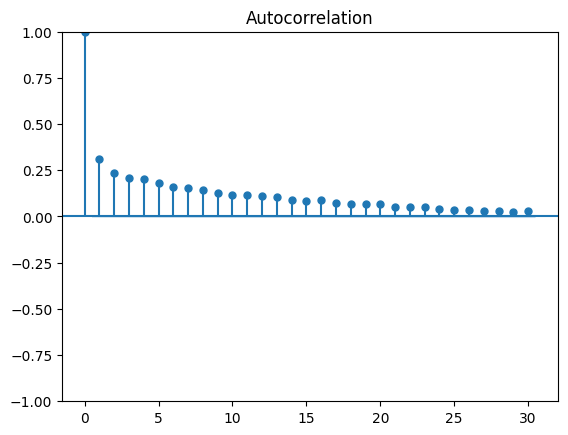

In [94]:
from statsmodels.graphics.tsaplots import plot_acf

# Plot autocorrelation for the target feature
plot_acf(df_new_drop_knn_impute['f82'], lags=30)
plt.show()

In [95]:
imp_feats = list(xgb_imp_no_impute['Features'])

In [96]:
float(xgb_imp_no_impute[xgb_imp_no_impute['Features']=='f84']['Importance'].iloc[0])

51.0

In [97]:
q2

29.5

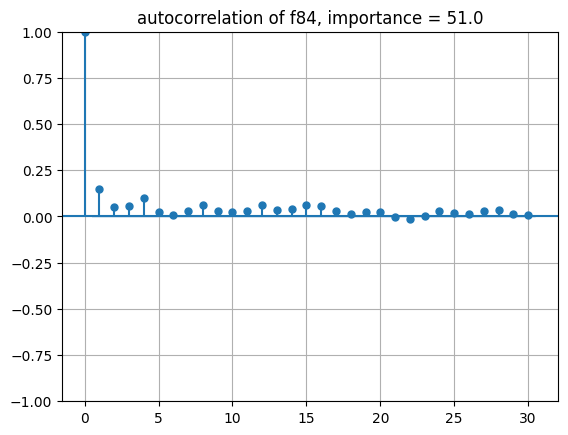

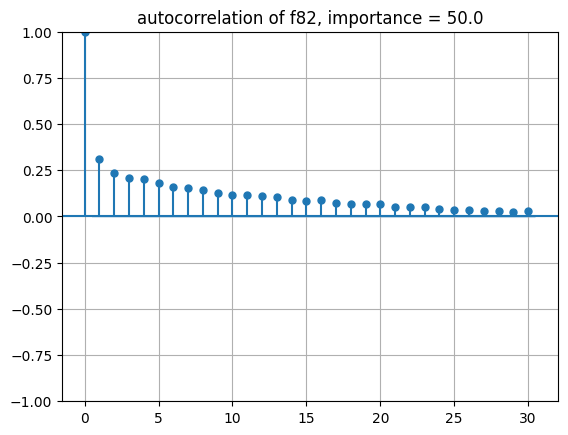

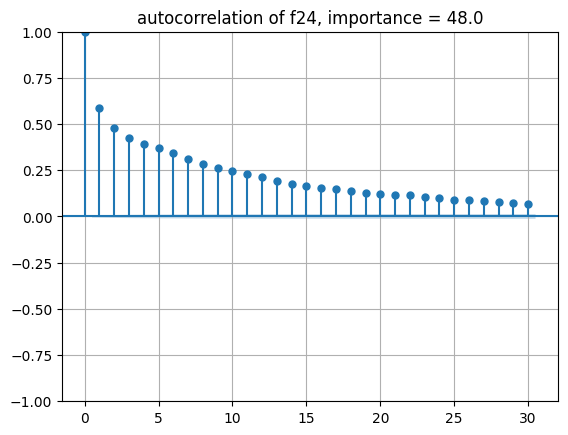

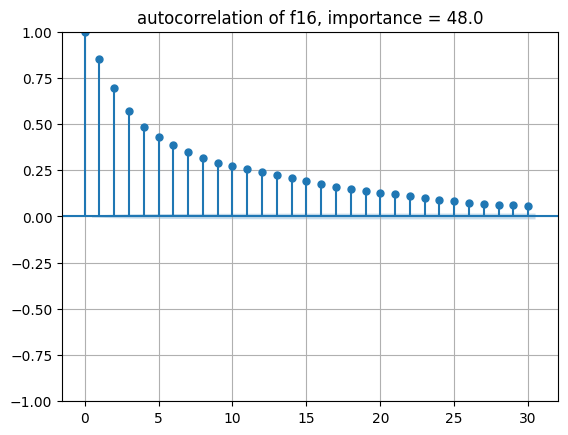

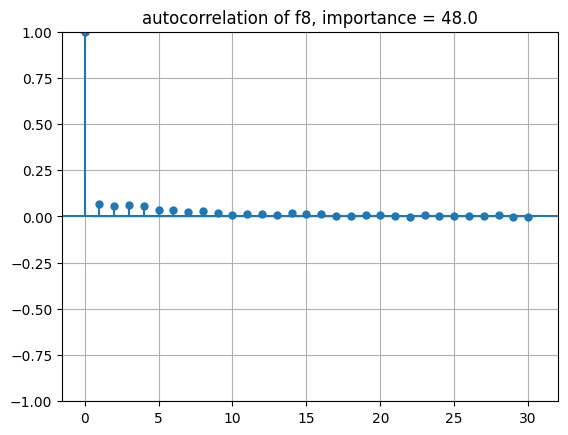

...

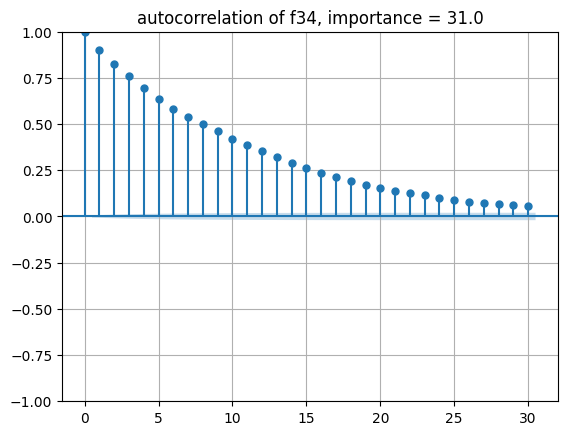

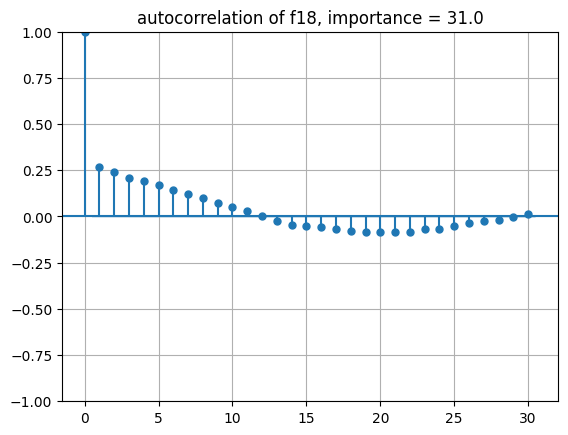

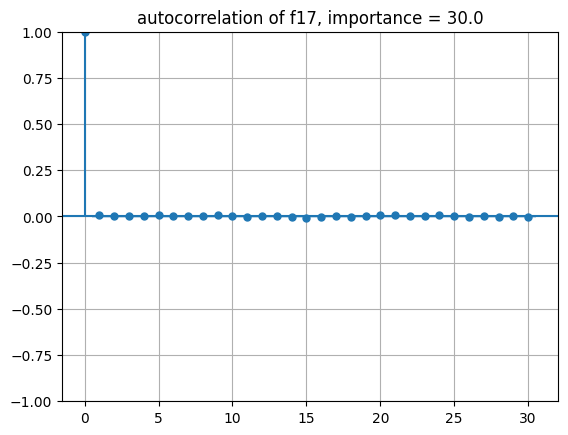

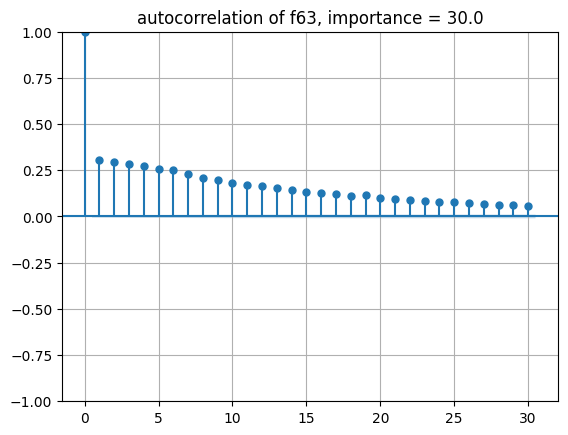

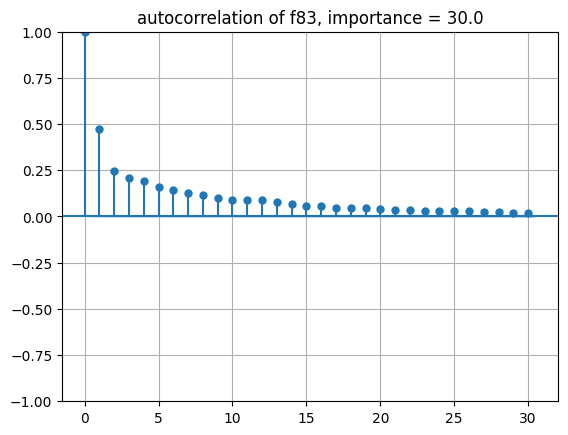

In [98]:
for feat in imp_feats:
    if feat in df_new_drop_knn_impute.columns:
        imp = float(xgb_imp_no_impute[xgb_imp_no_impute['Features']==feat]['Importance'].iloc[0])
        if imp >= q2:
            plot_acf(df_new_drop_knn_impute[feat], lags=30)
            plt.title(f'autocorrelation of {feat}, importance = {imp}') 
            plt.grid(True)
            plt.show()

# *SOME FEATURES HAVE SEASONALITY*

In [99]:
type(df_new_drop_knn_impute['f1'])

pandas.core.series.Series

In [100]:
from statsmodels.tsa.stattools import acf

def significant_lags(series, threshold=0.25, max_lags=2):
    # Calculate ACF values
    acf_values = acf(series.dropna(), nlags=max_lags)
    
    # Identify significant lags
    significant_lags = np.where(np.abs(acf_values) > threshold)[0]
    
    # Exclude lag 0 (autocorrelation with itself)
    significant_lags = significant_lags[significant_lags > 0]
    
    return significant_lags.tolist()

In [101]:
lag_dict = {}

for feat in imp_feats:
    if feat in df_new_drop_knn_impute.columns:
        imp = float(xgb_imp_no_impute[xgb_imp_no_impute['Features']==feat]['Importance'].iloc[0])
        if imp > q2:
            lag_dict[feat] = significant_lags(df_new_drop_knn_impute[feat])

In [102]:
lag_dict

{'f84': [],
 'f82': [1],
 'f24': [1, 2],
 'f16': [1, 2],
 'f8': [],
 'f64': [],
 'f59': [1],
 'f23': [],
 'f2': [],
 'f15': [],
 'f30': [1, 2],
 'f3': [1, 2],
 'f21': [],
 'f27': [],
 'f51': [],
 'f1': [],
 'f57': [],
 'f35': [1, 2],
 'f13': [1, 2],
 'f52': [],
 'f39': [],
 'f53': [],
 'f28': [1, 2],
 'f81': [1, 2],
 'f87': [1, 2],
 'f14': [],
 'f43': [],
 'f36': [1, 2],
 'f69': [],
 'f42': [1, 2],
 'f32': [1, 2],
 'f74': [],
 'f75': [],
 'f77': [],
 'f71': [1, 2],
 'f5': [1],
 'f66': [1],
 'f58': [],
 'f34': [1, 2],
 'f18': [1],
 'f17': [],
 'f63': [1, 2],
 'f83': [1]}

In [103]:
df_lag_dict = {'row_id': np.array(df_new_drop_knn_impute['row_id'])}

In [104]:
for key, value in lag_dict.items():
    df_lag_dict[key] = np.array(df_new_drop_knn_impute[key])
    # create lag feature
    for lag in value:
        df_lag_dict[f'{key}_lag_{lag}'] = np.array(df_new_drop_knn_impute[key].shift(lag))
df_lag_dict['target'] = np.array(df_new_drop_knn_impute['target'])
df_lag = pd.DataFrame(df_lag_dict)

In [105]:
df_lag

,row_id,f84,f82,f82_lag_1,f24,f24_lag_1,f24_lag_2,f16,f16_lag_1,f16_lag_2,f8,f64,f59,f59_lag_1,f23,f2,f15,f30,f30_lag_1,f30_lag_2,f3,f3_lag_1,f3_lag_2,f21,f27,f51,f1,f57,f35,f35_lag_1,f35_lag_2,f13,f13_lag_1,f13_lag_2,f52,f39,f53,f28,f28_lag_1,f28_lag_2,f81,f81_lag_1,f81_lag_2,f87,f87_lag_1,f87_lag_2,f14,f43,f36,f36_lag_1,f36_lag_2,f69,f42,f42_lag_1,f42_lag_2,f32,f32_lag_1,f32_lag_2,f74,f75,f77,f71,f71_lag_1,f71_lag_2,f5,f5_lag_1,f66,f66_lag_1,f58,f34,f34_lag_1,f34_lag_2,f18,f18_lag_1,f17,f63,f63_lag_1,f63_lag_2,f83,f83_lag_1,target
0,1.00,-0.14,0.01,NaN,-0.22,NaN,NaN,-0.72,NaN,NaN,-0.29,0.08,-1.01,NaN,-0.08,-3.48,0.09,0.41,NaN,NaN,-0.23,NaN,NaN,-0.24,-0.03,0.16,1.65,0.72,-1.66,NaN,NaN,0.30,NaN,NaN,-0.34,0.77,0.39,-0.17,NaN,NaN,0.03,NaN,NaN,0.99,NaN,NaN,0.29,0.79,-0.63,NaN,NaN,0.18,0.71,NaN,NaN,0.44,NaN,NaN,0.50,0.45,-2.20,-2.00,NaN,NaN,0.22,NaN,-0.08,NaN,0.62,1.52,NaN,NaN,1.11,NaN,0.12,0.02,NaN,NaN,0.30,NaN,-0.08
1,2.00,1.18,0.00,0.01,-0.16,-0.22,NaN,-0.76,-0.72,NaN,-0.40,-0.09,-0.77,-1.01,-0.08,-0.93,0.85,0.10,0.41,NaN,-0.34,-0.23,NaN,-0.31,-0.03,0.17,2.55,0.91,3.02,-1.66,NaN,0.67,0.30,NaN,-0.34,-2.11,-1.22,-0.14,-0.17,NaN,0.16,0.03,NaN,-0.22,0.99,NaN,0.08,0.96,-0.26,-0.63,NaN,0.19,0.66,0.71,NaN,0.49,0.44,NaN,0.50,0.52,-0.80,-2.00,-2.00,NaN,0.27,0.22,-0.11,-0.08,-0.97,1.24,1.52,NaN,2.01,1.11,-0.02,0.01,0.02,NaN,0.19,0.30,0.06
2,3.00,-0.73,0.00,0.00,-0.22,-0.16,-0.22,-3.18,-0.76,-0.72,-0.66,0.22,-0.85,-0.77,-0.49,0.99,0.59,0.09,0.10,0.41,0.04,-0.34,-0.23,-0.24,-0.00,0.16,-3.73,1.52,1.01,3.02,-1.66,0.50,0.67,0.30,-0.20,0.99,0.44,-0.17,-0.14,-0.17,0.04,0.16,0.03,0.36,-0.22,0.99,1.00,0.46,-0.26,-0.26,-0.63,0.18,0.67,0.66,0.71,0.45,0.49,0.44,0.76,0.45,0.15,-1.88,-2.00,-2.00,0.16,0.27,-0.08,-0.11,0.68,1.43,1.24,1.52,-2.74,2.01,-0.71,0.11,0.01,0.02,0.18,0.19,0.00
3,4.00,-0.40,0.00,0.00,-0.22,-0.22,-0.16,-3.99,-3.18,-0.76,-0.27,-0.05,2.46,-0.85,-0.20,0.04,0.43,0.09,0.09,0.10,0.31,0.04,-0.34,-0.98,-0.11,0.16,2.12,1.41,1.90,1.01,3.02,0.30,0.50,0.67,-0.39,0.10,3.45,-0.09,-0.17,-0.14,0.08,0.04,0.16,0.01,0.36,-0.22,-0.22,0.65,0.24,-0.26,-0.26,0.18,0.81,0.67,0.66,0.44,0.45,0.49,0.55,0.45,-0.37,-1.58,-1.88,-2.00,0.76,0.16,-0.19,-0.08,0.02,1.53,1.43,1.24,0.27,-2.74,0.73,1.00,0.11,0.01,0.33,0.18,-0.03
4,5.00,0.51,0.00,0.00,-0.22,-0.22,-0.22,-2.02,-3.99,-3.18,1.56,-0.04,-1.49,2.46,-0.03,-0.02,0.32,0.09,0.09,0.09,0.04,0.31,0.04,0.42,-0.19,0.16,-0.85,0.93,1.88,1.90,1.01,1.15,0.30,0.50,-0.27,0.70,1.20,0.01,-0.09,-0.17,0.05,0.08,0.04,-0.01,0.01,0.36,0.52,2.47,-0.03,0.24,-0.26,0.18,0.87,0.81,0.67,0.43,0.44,0.45,0.34,0.45,1.64,-1.63,-1.58,-1.88,0.12,0.76,-0.19,-0.19,0.90,1.49,1.53,1.43,-0.81,0.27,0.88,0.03,1.00,0.11,0.54,0.33,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625.00,1.00,0.02,0.04,1.12,1.17,-1.02,-2.19,-0.28,-3.25,-0.10,0.05,-0.04,2.06,1.37,1.10,0.08,0.05,0.07,0.05,1.11,-0.18,-0.18,0.25,-0.47,0.31,1.14,-0.87,3.12,3.08,3.28,-0.69,-0.69,-0.69,2.77,-1.44,-4.00,-0.34,0.12,0.24,0.14,0.04,0.07,-0.28,-0.47,-0.51,-0.21,0.34,0.02,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.86,0.82,0.85,0.42,0.28,0.13,-0.29,-0.29,-0.18,0.00,0.83,0.00,0.00,0.24,0.34,0.78,0.59,1.33,1.60,-0.19,0.22,0.22,0.22,0.46,0.22,0.00
105438,173659.00,1.00,0.01,0.02,1.14,1.12,1.17,-1.78,-2.19,-0.28,0.34,0.05,0.40,-0.04,-2.43,0.29,0.08,0.25,0.05,0.07,-0.18,1.11,-0.18,0.25,-0.18,0.39,-1.37,-0.66,2.78,3.12,3.08,-0.69,-0.69,-0.69,-0.12,-0.83,1.31,-0.13,-0.34,0.12,0.18,0.14,0.04,0.98,-0.28,-0.47,-0.21,0.55,-0.04,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.02,0.86,0.82,0.22,0.06,-0.71,-0.18,-0.29,-0.29,0.00,0.00,0.00,0.00,-0.78,0.00,0.34,0.78,0.69,1.33,0.09,0.22,0.22,0.22,0.25,0.46,-0.01
105439,173670.00,1.00,0.01,0.01,-0.30,1.14,1.12,-2.17,-1.78,-2.19,0.18,0.05,-0.04,0.40,-3.83,0.34,0.08,0.19,0.25,0.05,-0.18,

# xgboost on df_lag

In [106]:
X = df_lag.drop(columns=['row_id', 'target'])
y = df_lag['target']

In [107]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.004151669331499918


In [108]:
df_lag_no_nan = df_lag.dropna()
df_lag_no_nan

,row_id,f84,f82,f82_lag_1,f24,f24_lag_1,f24_lag_2,f16,f16_lag_1,f16_lag_2,f8,f64,f59,f59_lag_1,f23,f2,f15,f30,f30_lag_1,f30_lag_2,f3,f3_lag_1,f3_lag_2,f21,f27,f51,f1,f57,f35,f35_lag_1,f35_lag_2,f13,f13_lag_1,f13_lag_2,f52,f39,f53,f28,f28_lag_1,f28_lag_2,f81,f81_lag_1,f81_lag_2,f87,f87_lag_1,f87_lag_2,f14,f43,f36,f36_lag_1,f36_lag_2,f69,f42,f42_lag_1,f42_lag_2,f32,f32_lag_1,f32_lag_2,f74,f75,f77,f71,f71_lag_1,f71_lag_2,f5,f5_lag_1,f66,f66_lag_1,f58,f34,f34_lag_1,f34_lag_2,f18,f18_lag_1,f17,f63,f63_lag_1,f63_lag_2,f83,f83_lag_1,target
2,3.00,-0.73,0.00,0.00,-0.22,-0.16,-0.22,-3.18,-0.76,-0.72,-0.66,0.22,-0.85,-0.77,-0.49,0.99,0.59,0.09,0.10,0.41,0.04,-0.34,-0.23,-0.24,-0.00,0.16,-3.73,1.52,1.01,3.02,-1.66,0.50,0.67,0.30,-0.20,0.99,0.44,-0.17,-0.14,-0.17,0.04,0.16,0.03,0.36,-0.22,0.99,1.00,0.46,-0.26,-0.26,-0.63,0.18,0.67,0.66,0.71,0.45,0.49,0.44,0.76,0.45,0.15,-1.88,-2.00,-2.00,0.16,0.27,-0.08,-0.11,0.68,1.43,1.24,1.52,-2.74,2.01,-0.71,0.11,0.01,0.02,0.18,0.19,0.00
3,4.00,-0.40,0.00,0.00,-0.22,-0.22,-0.16,-3.99,-3.18,-0.76,-0.27,-0.05,2.46,-0.85,-0.20,0.04,0.43,0.09,0.09,0.10,0.31,0.04,-0.34,-0.98,-0.11,0.16,2.12,1.41,1.90,1.01,3.02,0.30,0.50,0.67,-0.39,0.10,3.45,-0.09,-0.17,-0.14,0.08,0.04,0.16,0.01,0.36,-0.22,-0.22,0.65,0.24,-0.26,-0.26,0.18,0.81,0.67,0.66,0.44,0.45,0.49,0.55,0.45,-0.37,-1.58,-1.88,-2.00,0.76,0.16,-0.19,-0.08,0.02,1.53,1.43,1.24,0.27,-2.74,0.73,1.00,0.11,0.01,0.33,0.18,-0.03
4,5.00,0.51,0.00,0.00,-0.22,-0.22,-0.22,-2.02,-3.99,-3.18,1.56,-0.04,-1.49,2.46,-0.03,-0.02,0.32,0.09,0.09,0.09,0.04,0.31,0.04,0.42,-0.19,0.16,-0.85,0.93,1.88,1.90,1.01,1.15,0.30,0.50,-0.27,0.70,1.20,0.01,-0.09,-0.17,0.05,0.08,0.04,-0.01,0.01,0.36,0.52,2.47,-0.03,0.24,-0.26,0.18,0.87,0.81,0.67,0.43,0.44,0.45,0.34,0.45,1.64,-1.63,-1.58,-1.88,0.12,0.76,-0.19,-0.19,0.90,1.49,1.53,1.43,-0.81,0.27,0.88,0.03,1.00,0.11,0.54,0.33,0.06
5,6.00,1.60,0.00,0.00,-0.22,-0.22,-0.22,-1.25,-2.02,-3.99,-1.14,0.06,1.09,-1.49,-0.20,0.92,0.54,0.08,0.09,0.09,-0.22,0.04,0.31,-0.40,-0.11,0.16,0.62,-1.48,3.06,1.88,1.90,0.84,1.15,0.30,-0.39,0.48,1.46,-0.08,0.01,-0.09,0.03,0.05,0.08,-0.21,-0.01,0.01,0.57,0.35,-0.08,-0.03,0.24,0.18,0.48,0.87,0.81,0.51,0.43,0.44,0.31,0.45,-1.00,-1.58,-1.63,-1.58,0.22,0.12,0.00,-0.19,0.52,1.78,1.49,1.53,0.77,-0.81,-0.22,0.23,0.03,1.00,0.52,0.54,-0.09
6,7.00,2.07,0.00,0.00,-0.13,-0.22,-0.22,-1.09,-1.25,-2.02,-0.20,-0.21,0.36,1.09,-0.57,1.02,0.25,0.09,0.08,0.09,-0.79,-0.22,0.04,-0.25,-0.01,0.19,-0.76,1.11,3.25,3.06,1.88,1.03,0.84,1.15,-0.34,0.33,-3.33,-0.22,-0.08,0.01,0.11,0.03,0.05,-0.13,-0.21,-0.01,0.38,-1.30,-0.16,-0.08,-0.03,0.16,0.62,0.48,0.87,0.47,0.51,0.43,0.22,0.44,1.71,-1.74,-1.58,-1.63,0.36,0.22,-0.10,0.00,0.30,1.82,1.78,1.49,-0.17,0.77,-0.42,0.12,0.23,0.03,0.61,0.52,0.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625.00,1.00,0.02,0.04,1.12,1.17,-1.02,-2.19,-0.28,-3.25,-0.10,0.05,-0.04,2.06,1.37,1.10,0.08,0.05,0.07,0.05,1.11,-0.18,-0.18,0.25,-0.47,0.31,1.14,-0.87,3.12,3.08,3.28,-0.69,-0.69,-0.69,2.77,-1.44,-4.00,-0.34,0.12,0.24,0.14,0.04,0.07,-0.28,-0.47,-0.51,-0.21,0.34,0.02,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.86,0.82,0.85,0.42,0.28,0.13,-0.29,-0.29,-0.18,0.00,0.83,0.00,0.00,0.24,0.34,0.78,0.59,1.33,1.60,-0.19,0.22,0.22,0.22,0.46,0.22,0.00
105438,173659.00,1.00,0.01,0.02,1.14,1.12,1.17,-1.78,-2.19,-0.28,0.34,0.05,0.40,-0.04,-2.43,0.29,0.08,0.25,0.05,0.07,-0.18,1.11,-0.18,0.25,-0.18,0.39,-1.37,-0.66,2.78,3.12,3.08,-0.69,-0.69,-0.69,-0.12,-0.83,1.31,-0.13,-0.34,0.12,0.18,0.14,0.04,0.98,-0.28,-0.47,-0.21,0.55,-0.04,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.02,0.86,0.82,0.22,0.06,-0.71,-0.18,-0.29,-0.29,0.00,0.00,0.00,0.00,-0.78,0.00,0.34,0.78,0.69,1.33,0.09,0.22,0.22,0.22,0.25,0.46,-0.01
105439,173670.00,1.00,0.01,0.01,-0.30,1.14,1.12,-2.17,-1.78,-2

In [109]:
X = df_lag_no_nan.drop(columns=['row_id', 'target'])
y = df_lag_no_nan['target']

In [110]:
# Split data into training and testing sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=42)

xg_reg = xgb.XGBRegressor(objective='reg:squarederror', colsample_bytree=0.3, learning_rate=0.1,
                          max_depth=5, alpha=10, n_estimators=100)

xg_reg.fit(X_train, y_train)

y_pred = xg_reg.predict(X_val)

mse = mean_squared_error(y_val, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 0.00425399124086243


# trying transformers

In [252]:
train_data = df_lag_no_nan.drop(columns=['row_id'])
train_data

,f84,f82,f82_lag_1,f24,f24_lag_1,f24_lag_2,f16,f16_lag_1,f16_lag_2,f8,f64,f59,f59_lag_1,f23,f2,f15,f30,f30_lag_1,f30_lag_2,f3,f3_lag_1,f3_lag_2,f21,f27,f51,f1,f57,f35,f35_lag_1,f35_lag_2,f13,f13_lag_1,f13_lag_2,f52,f39,f53,f28,f28_lag_1,f28_lag_2,f81,f81_lag_1,f81_lag_2,f87,f87_lag_1,f87_lag_2,f14,f43,f36,f36_lag_1,f36_lag_2,f69,f42,f42_lag_1,f42_lag_2,f32,f32_lag_1,f32_lag_2,f74,f75,f77,f71,f71_lag_1,f71_lag_2,f5,f5_lag_1,f66,f66_lag_1,f58,f34,f34_lag_1,f34_lag_2,f18,f18_lag_1,f17,f63,f63_lag_1,f63_lag_2,f83,f83_lag_1,target
2,-0.73,0.00,0.00,-0.22,-0.16,-0.22,-3.18,-0.76,-0.72,-0.66,0.22,-0.85,-0.77,-0.49,0.99,0.59,0.09,0.10,0.41,0.04,-0.34,-0.23,-0.24,-0.00,0.16,-3.73,1.52,1.01,3.02,-1.66,0.50,0.67,0.30,-0.20,0.99,0.44,-0.17,-0.14,-0.17,0.04,0.16,0.03,0.36,-0.22,0.99,1.00,0.46,-0.26,-0.26,-0.63,0.18,0.67,0.66,0.71,0.45,0.49,0.44,0.76,0.45,0.15,-1.88,-2.00,-2.00,0.16,0.27,-0.08,-0.11,0.68,1.43,1.24,1.52,-2.74,2.01,-0.71,0.11,0.01,0.02,0.18,0.19,0.00
3,-0.40,0.00,0.00,-0.22,-0.22,-0.16,-3.99,-3.18,-0.76,-0.27,-0.05,2.46,-0.85,-0.20,0.04,0.43,0.09,0.09,0.10,0.31,0.04,-0.34,-0.98,-0.11,0.16,2.12,1.41,1.90,1.01,3.02,0.30,0.50,0.67,-0.39,0.10,3.45,-0.09,-0.17,-0.14,0.08,0.04,0.16,0.01,0.36,-0.22,-0.22,0.65,0.24,-0.26,-0.26,0.18,0.81,0.67,0.66,0.44,0.45,0.49,0.55,0.45,-0.37,-1.58,-1.88,-2.00,0.76,0.16,-0.19,-0.08,0.02,1.53,1.43,1.24,0.27,-2.74,0.73,1.00,0.11,0.01,0.33,0.18,-0.03
4,0.51,0.00,0.00,-0.22,-0.22,-0.22,-2.02,-3.99,-3.18,1.56,-0.04,-1.49,2.46,-0.03,-0.02,0.32,0.09,0.09,0.09,0.04,0.31,0.04,0.42,-0.19,0.16,-0.85,0.93,1.88,1.90,1.01,1.15,0.30,0.50,-0.27,0.70,1.20,0.01,-0.09,-0.17,0.05,0.08,0.04,-0.01,0.01,0.36,0.52,2.47,-0.03,0.24,-0.26,0.18,0.87,0.81,0.67,0.43,0.44,0.45,0.34,0.45,1.64,-1.63,-1.58,-1.88,0.12,0.76,-0.19,-0.19,0.90,1.49,1.53,1.43,-0.81,0.27,0.88,0.03,1.00,0.11,0.54,0.33,0.06
5,1.60,0.00,0.00,-0.22,-0.22,-0.22,-1.25,-2.02,-3.99,-1.14,0.06,1.09,-1.49,-0.20,0.92,0.54,0.08,0.09,0.09,-0.22,0.04,0.31,-0.40,-0.11,0.16,0.62,-1.48,3.06,1.88,1.90,0.84,1.15,0.30,-0.39,0.48,1.46,-0.08,0.01,-0.09,0.03,0.05,0.08,-0.21,-0.01,0.01,0.57,0.35,-0.08,-0.03,0.24,0.18,0.48,0.87,0.81,0.51,0.43,0.44,0.31,0.45,-1.00,-1.58,-1.63,-1.58,0.22,0.12,0.00,-0.19,0.52,1.78,1.49,1.53,0.77,-0.81,-0.22,0.23,0.03,1.00,0.52,0.54,-0.09
6,2.07,0.00,0.00,-0.13,-0.22,-0.22,-1.09,-1.25,-2.02,-0.20,-0.21,0.36,1.09,-0.57,1.02,0.25,0.09,0.08,0.09,-0.79,-0.22,0.04,-0.25,-0.01,0.19,-0.76,1.11,3.25,3.06,1.88,1.03,0.84,1.15,-0.34,0.33,-3.33,-0.22,-0.08,0.01,0.11,0.03,0.05,-0.13,-0.21,-0.01,0.38,-1.30,-0.16,-0.08,-0.03,0.16,0.62,0.48,0.87,0.47,0.51,0.43,0.22,0.44,1.71,-1.74,-1.58,-1.63,0.36,0.22,-0.10,0.00,0.30,1.82,1.78,1.49,-0.17,0.77,-0.42,0.12,0.23,0.03,0.61,0.52,0.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,1.00,0.02,0.04,1.12,1.17,-1.02,-2.19,-0.28,-3.25,-0.10,0.05,-0.04,2.06,1.37,1.10,0.08,0.05,0.07,0.05,1.11,-0.18,-0.18,0.25,-0.47,0.31,1.14,-0.87,3.12,3.08,3.28,-0.69,-0.69,-0.69,2.77,-1.44,-4.00,-0.34,0.12,0.24,0.14,0.04,0.07,-0.28,-0.47,-0.51,-0.21,0.34,0.02,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.86,0.82,0.85,0.42,0.28,0.13,-0.29,-0.29,-0.18,0.00,0.83,0.00,0.00,0.24,0.34,0.78,0.59,1.33,1.60,-0.19,0.22,0.22,0.22,0.46,0.22,0.00
105438,1.00,0.01,0.02,1.14,1.12,1.17,-1.78,-2.19,-0.28,0.34,0.05,0.40,-0.04,-2.43,0.29,0.08,0.25,0.05,0.07,-0.18,1.11,-0.18,0.25,-0.18,0.39,-1.37,-0.66,2.78,3.12,3.08,-0.69,-0.69,-0.69,-0.12,-0.83,1.31,-0.13,-0.34,0.12,0.18,0.14,0.04,0.98,-0.28,-0.47,-0.21,0.55,-0.04,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.02,0.86,0.82,0.22,0.06,-0.71,-0.18,-0.29,-0.29,0.00,0.00,0.00,0.00,-0.78,0.00,0.34,0.78,0.69,1.33,0.09,0.22,0.22,0.22,0.25,0.46,-0.01
105439,1.00,0.01,0.01,-0.30,1.14,1.12,-2.17,-1.78,-2.19,0.18,0.05,-0.04,0.40,-3.83,0.34,0.08,0.19,0.25,0.05,-0.18,-0.1

In [246]:
train_data.to_csv('transformer_train.csv')

In [9]:
train_data = pd.read_csv('/kaggle/input/transformer-train/transformer_train.csv')

In [11]:
train_data = train_data.drop(columns=['Unnamed: 0'])
train_data

,f84,f82,f82_lag_1,f24,f24_lag_1,f24_lag_2,f16,f16_lag_1,f16_lag_2,f8,f64,f59,f59_lag_1,f23,f2,f15,f30,f30_lag_1,f30_lag_2,f3,f3_lag_1,f3_lag_2,f21,f27,f51,f1,f57,f35,f35_lag_1,f35_lag_2,f13,f13_lag_1,f13_lag_2,f52,f39,f53,f28,f28_lag_1,f28_lag_2,f81,f81_lag_1,f81_lag_2,f87,f87_lag_1,f87_lag_2,f14,f43,f36,f36_lag_1,f36_lag_2,f69,f42,f42_lag_1,f42_lag_2,f32,f32_lag_1,f32_lag_2,f74,f75,f77,f71,f71_lag_1,f71_lag_2,f5,f5_lag_1,f66,f66_lag_1,f58,f34,f34_lag_1,f34_lag_2,f18,f18_lag_1,f17,f63,f63_lag_1,f63_lag_2,f83,f83_lag_1,target
0,-0.73,0.00,0.00,-0.22,-0.16,-0.22,-3.18,-0.76,-0.72,-0.66,0.22,-0.85,-0.77,-0.49,0.99,0.59,0.09,0.10,0.41,0.04,-0.34,-0.23,-0.24,-0.00,0.16,-3.73,1.52,1.01,3.02,-1.66,0.50,0.67,0.30,-0.20,0.99,0.44,-0.17,-0.14,-0.17,0.04,0.16,0.03,0.36,-0.22,0.99,1.00,0.46,-0.26,-0.26,-0.63,0.18,0.67,0.66,0.71,0.45,0.49,0.44,0.76,0.45,0.15,-1.88,-2.00,-2.00,0.16,0.27,-0.08,-0.11,0.68,1.43,1.24,1.52,-2.74,2.01,-0.71,0.11,0.01,0.02,0.18,0.19,0.00
1,-0.40,0.00,0.00,-0.22,-0.22,-0.16,-3.99,-3.18,-0.76,-0.27,-0.05,2.46,-0.85,-0.20,0.04,0.43,0.09,0.09,0.10,0.31,0.04,-0.34,-0.98,-0.11,0.16,2.12,1.41,1.90,1.01,3.02,0.30,0.50,0.67,-0.39,0.10,3.45,-0.09,-0.17,-0.14,0.08,0.04,0.16,0.01,0.36,-0.22,-0.22,0.65,0.24,-0.26,-0.26,0.18,0.81,0.67,0.66,0.44,0.45,0.49,0.55,0.45,-0.37,-1.58,-1.88,-2.00,0.76,0.16,-0.19,-0.08,0.02,1.53,1.43,1.24,0.27,-2.74,0.73,1.00,0.11,0.01,0.33,0.18,-0.03
2,0.51,0.00,0.00,-0.22,-0.22,-0.22,-2.02,-3.99,-3.18,1.56,-0.04,-1.49,2.46,-0.03,-0.02,0.32,0.09,0.09,0.09,0.04,0.31,0.04,0.42,-0.19,0.16,-0.85,0.93,1.88,1.90,1.01,1.15,0.30,0.50,-0.27,0.70,1.20,0.01,-0.09,-0.17,0.05,0.08,0.04,-0.01,0.01,0.36,0.52,2.47,-0.03,0.24,-0.26,0.18,0.87,0.81,0.67,0.43,0.44,0.45,0.34,0.45,1.64,-1.63,-1.58,-1.88,0.12,0.76,-0.19,-0.19,0.90,1.49,1.53,1.43,-0.81,0.27,0.88,0.03,1.00,0.11,0.54,0.33,0.06
3,1.60,0.00,0.00,-0.22,-0.22,-0.22,-1.25,-2.02,-3.99,-1.14,0.06,1.09,-1.49,-0.20,0.92,0.54,0.08,0.09,0.09,-0.22,0.04,0.31,-0.40,-0.11,0.16,0.62,-1.48,3.06,1.88,1.90,0.84,1.15,0.30,-0.39,0.48,1.46,-0.08,0.01,-0.09,0.03,0.05,0.08,-0.21,-0.01,0.01,0.57,0.35,-0.08,-0.03,0.24,0.18,0.48,0.87,0.81,0.51,0.43,0.44,0.31,0.45,-1.00,-1.58,-1.63,-1.58,0.22,0.12,0.00,-0.19,0.52,1.78,1.49,1.53,0.77,-0.81,-0.22,0.23,0.03,1.00,0.52,0.54,-0.09
4,2.07,0.00,0.00,-0.13,-0.22,-0.22,-1.09,-1.25,-2.02,-0.20,-0.21,0.36,1.09,-0.57,1.02,0.25,0.09,0.08,0.09,-0.79,-0.22,0.04,-0.25,-0.01,0.19,-0.76,1.11,3.25,3.06,1.88,1.03,0.84,1.15,-0.34,0.33,-3.33,-0.22,-0.08,0.01,0.11,0.03,0.05,-0.13,-0.21,-0.01,0.38,-1.30,-0.16,-0.08,-0.03,0.16,0.62,0.48,0.87,0.47,0.51,0.43,0.22,0.44,1.71,-1.74,-1.58,-1.63,0.36,0.22,-0.10,0.00,0.30,1.82,1.78,1.49,-0.17,0.77,-0.42,0.12,0.23,0.03,0.61,0.52,0.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105435,1.00,0.02,0.04,1.12,1.17,-1.02,-2.19,-0.28,-3.25,-0.10,0.05,-0.04,2.06,1.37,1.10,0.08,0.05,0.07,0.05,1.11,-0.18,-0.18,0.25,-0.47,0.31,1.14,-0.87,3.12,3.08,3.28,-0.69,-0.69,-0.69,2.77,-1.44,-4.00,-0.34,0.12,0.24,0.14,0.04,0.07,-0.28,-0.47,-0.51,-0.21,0.34,0.02,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.86,0.82,0.85,0.42,0.28,0.13,-0.29,-0.29,-0.18,0.00,0.83,0.00,0.00,0.24,0.34,0.78,0.59,1.33,1.60,-0.19,0.22,0.22,0.22,0.46,0.22,0.00
105436,1.00,0.01,0.02,1.14,1.12,1.17,-1.78,-2.19,-0.28,0.34,0.05,0.40,-0.04,-2.43,0.29,0.08,0.25,0.05,0.07,-0.18,1.11,-0.18,0.25,-0.18,0.39,-1.37,-0.66,2.78,3.12,3.08,-0.69,-0.69,-0.69,-0.12,-0.83,1.31,-0.13,-0.34,0.12,0.18,0.14,0.04,0.98,-0.28,-0.47,-0.21,0.55,-0.04,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.02,0.86,0.82,0.22,0.06,-0.71,-0.18,-0.29,-0.29,0.00,0.00,0.00,0.00,-0.78,0.00,0.34,0.78,0.69,1.33,0.09,0.22,0.22,0.22,0.25,0.46,-0.01
105437,1.00,0.01,0.01,-0.30,1.14,1.12,-2.17,-1.78,-2.19,0.18,0.05,-0.04,0.40,-3.83,0.34,0.08,0.19,0.25,0.05,-0.18,-0.1

In [12]:
import torch
import torch.nn as nn
import torch.optim as optim

In [13]:
train_data = torch.tensor(np.array(train_data))

In [14]:
train_data[2:3, -1].unsqueeze(1)

tensor([[0.0591]], dtype=torch.float64)

In [ ]:
class TransformerModel(nn.Module):
    def __init__(self, enc_input_dim, dcd_input_dim, model_dim, num_heads, num_layers, output_dim):
        super(TransformerModel, self).__init__()
        self.encoder_layer = nn.TransformerEncoderLayer(d_model=model_dim, nhead=num_heads)
        self.encoder = nn.TransformerEncoder(self.encoder_layer, num_layers=num_layers)
        self.decoder_layer = nn.TransformerDecoderLayer(d_model=model_dim, nhead=num_heads)
        self.decoder = nn.TransformerDecoder(self.decoder_layer, num_layers=num_layers)
        self.linear = nn.Linear(model_dim, output_dim)
        self.enc_embedding = nn.Linear(enc_input_dim, model_dim)
        self.dcd_embedding = nn.Linear(dcd_input_dim, model_dim)
        
    def forward(self, src, tgt):
        src = self.enc_embedding(src.float())
        tgt = self.dcd_embedding(tgt.float())
        memory = self.encoder(src)
        output = self.decoder(tgt, memory)
        output = self.linear(output)
        return output

# Hyperparameters
enc_input_dim = 80
dcd_input_dim = 79
model_dim = 128  # Transformer model dimension
num_heads = 4
num_layers = 2
output_dim = 1  # Single target value

# Initialize model, loss function, and optimizer
model = TransformerModel(enc_input_dim, dcd_input_dim, model_dim, num_heads, num_layers, output_dim)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Training loop
num_epochs = 10  # Define the number of epochs
for epoch in range(num_epochs):
    print(f"starting epoch {epoch+1}/{num_epochs}")
    model.train()
    for i in range(1, len(train_data)):
        src = train_data[:i, :].unsqueeze(1).float()  # All previous rows (excluding targets), shape [seq_len, batch_size, feature_dim]
        tgt = train_data[i:i+1, :-1].unsqueeze(1).float()  # Current row features, shape [1, batch_size, feature_dim]
        true_target = train_data[i:i+1, -1].unsqueeze(1).float()  # Current row target, shape [1, batch_size, 1]

        optimizer.zero_grad()
        output = model(src, tgt).float()
        loss = criterion(output.squeeze(), true_target.squeeze())
        loss.backward()
        optimizer.step()
    print(f"epoch {epoch+1}/{num_epochs} done")

# Prediction
# model.eval()
# with torch.no_grad():
#     for i in range(len(test_data)):
#         src = concatenated_data[:test_data_start_idx + i, :-1].unsqueeze(1)  # All previous rows including train data
#         tgt = test_data[i:i+1, :-1].unsqueeze(1)  # Current test row features
#         output = model(src, tgt)
#         test_data[i, -1] = output.item()  # Fill in the predicted target


/opt/conda/lib/python3.10/site-packages/torch/nn/modules/transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


starting epoch 1/10


# feature transformation for linear regression

In [111]:
df_lag_no_nan

,row_id,f84,f82,f82_lag_1,f24,f24_lag_1,f24_lag_2,f16,f16_lag_1,f16_lag_2,f8,f64,f59,f59_lag_1,f23,f2,f15,f30,f30_lag_1,f30_lag_2,f3,f3_lag_1,f3_lag_2,f21,f27,f51,f1,f57,f35,f35_lag_1,f35_lag_2,f13,f13_lag_1,f13_lag_2,f52,f39,f53,f28,f28_lag_1,f28_lag_2,f81,f81_lag_1,f81_lag_2,f87,f87_lag_1,f87_lag_2,f14,f43,f36,f36_lag_1,f36_lag_2,f69,f42,f42_lag_1,f42_lag_2,f32,f32_lag_1,f32_lag_2,f74,f75,f77,f71,f71_lag_1,f71_lag_2,f5,f5_lag_1,f66,f66_lag_1,f58,f34,f34_lag_1,f34_lag_2,f18,f18_lag_1,f17,f63,f63_lag_1,f63_lag_2,f83,f83_lag_1,target
2,3.00,-0.73,0.00,0.00,-0.22,-0.16,-0.22,-3.18,-0.76,-0.72,-0.66,0.22,-0.85,-0.77,-0.49,0.99,0.59,0.09,0.10,0.41,0.04,-0.34,-0.23,-0.24,-0.00,0.16,-3.73,1.52,1.01,3.02,-1.66,0.50,0.67,0.30,-0.20,0.99,0.44,-0.17,-0.14,-0.17,0.04,0.16,0.03,0.36,-0.22,0.99,1.00,0.46,-0.26,-0.26,-0.63,0.18,0.67,0.66,0.71,0.45,0.49,0.44,0.76,0.45,0.15,-1.88,-2.00,-2.00,0.16,0.27,-0.08,-0.11,0.68,1.43,1.24,1.52,-2.74,2.01,-0.71,0.11,0.01,0.02,0.18,0.19,0.00
3,4.00,-0.40,0.00,0.00,-0.22,-0.22,-0.16,-3.99,-3.18,-0.76,-0.27,-0.05,2.46,-0.85,-0.20,0.04,0.43,0.09,0.09,0.10,0.31,0.04,-0.34,-0.98,-0.11,0.16,2.12,1.41,1.90,1.01,3.02,0.30,0.50,0.67,-0.39,0.10,3.45,-0.09,-0.17,-0.14,0.08,0.04,0.16,0.01,0.36,-0.22,-0.22,0.65,0.24,-0.26,-0.26,0.18,0.81,0.67,0.66,0.44,0.45,0.49,0.55,0.45,-0.37,-1.58,-1.88,-2.00,0.76,0.16,-0.19,-0.08,0.02,1.53,1.43,1.24,0.27,-2.74,0.73,1.00,0.11,0.01,0.33,0.18,-0.03
4,5.00,0.51,0.00,0.00,-0.22,-0.22,-0.22,-2.02,-3.99,-3.18,1.56,-0.04,-1.49,2.46,-0.03,-0.02,0.32,0.09,0.09,0.09,0.04,0.31,0.04,0.42,-0.19,0.16,-0.85,0.93,1.88,1.90,1.01,1.15,0.30,0.50,-0.27,0.70,1.20,0.01,-0.09,-0.17,0.05,0.08,0.04,-0.01,0.01,0.36,0.52,2.47,-0.03,0.24,-0.26,0.18,0.87,0.81,0.67,0.43,0.44,0.45,0.34,0.45,1.64,-1.63,-1.58,-1.88,0.12,0.76,-0.19,-0.19,0.90,1.49,1.53,1.43,-0.81,0.27,0.88,0.03,1.00,0.11,0.54,0.33,0.06
5,6.00,1.60,0.00,0.00,-0.22,-0.22,-0.22,-1.25,-2.02,-3.99,-1.14,0.06,1.09,-1.49,-0.20,0.92,0.54,0.08,0.09,0.09,-0.22,0.04,0.31,-0.40,-0.11,0.16,0.62,-1.48,3.06,1.88,1.90,0.84,1.15,0.30,-0.39,0.48,1.46,-0.08,0.01,-0.09,0.03,0.05,0.08,-0.21,-0.01,0.01,0.57,0.35,-0.08,-0.03,0.24,0.18,0.48,0.87,0.81,0.51,0.43,0.44,0.31,0.45,-1.00,-1.58,-1.63,-1.58,0.22,0.12,0.00,-0.19,0.52,1.78,1.49,1.53,0.77,-0.81,-0.22,0.23,0.03,1.00,0.52,0.54,-0.09
6,7.00,2.07,0.00,0.00,-0.13,-0.22,-0.22,-1.09,-1.25,-2.02,-0.20,-0.21,0.36,1.09,-0.57,1.02,0.25,0.09,0.08,0.09,-0.79,-0.22,0.04,-0.25,-0.01,0.19,-0.76,1.11,3.25,3.06,1.88,1.03,0.84,1.15,-0.34,0.33,-3.33,-0.22,-0.08,0.01,0.11,0.03,0.05,-0.13,-0.21,-0.01,0.38,-1.30,-0.16,-0.08,-0.03,0.16,0.62,0.48,0.87,0.47,0.51,0.43,0.22,0.44,1.71,-1.74,-1.58,-1.63,0.36,0.22,-0.10,0.00,0.30,1.82,1.78,1.49,-0.17,0.77,-0.42,0.12,0.23,0.03,0.61,0.52,0.09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625.00,1.00,0.02,0.04,1.12,1.17,-1.02,-2.19,-0.28,-3.25,-0.10,0.05,-0.04,2.06,1.37,1.10,0.08,0.05,0.07,0.05,1.11,-0.18,-0.18,0.25,-0.47,0.31,1.14,-0.87,3.12,3.08,3.28,-0.69,-0.69,-0.69,2.77,-1.44,-4.00,-0.34,0.12,0.24,0.14,0.04,0.07,-0.28,-0.47,-0.51,-0.21,0.34,0.02,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.86,0.82,0.85,0.42,0.28,0.13,-0.29,-0.29,-0.18,0.00,0.83,0.00,0.00,0.24,0.34,0.78,0.59,1.33,1.60,-0.19,0.22,0.22,0.22,0.46,0.22,0.00
105438,173659.00,1.00,0.01,0.02,1.14,1.12,1.17,-1.78,-2.19,-0.28,0.34,0.05,0.40,-0.04,-2.43,0.29,0.08,0.25,0.05,0.07,-0.18,1.11,-0.18,0.25,-0.18,0.39,-1.37,-0.66,2.78,3.12,3.08,-0.69,-0.69,-0.69,-0.12,-0.83,1.31,-0.13,-0.34,0.12,0.18,0.14,0.04,0.98,-0.28,-0.47,-0.21,0.55,-0.04,0.02,0.02,0.23,-0.73,-0.73,-0.73,0.02,0.86,0.82,0.22,0.06,-0.71,-0.18,-0.29,-0.29,0.00,0.00,0.00,0.00,-0.78,0.00,0.34,0.78,0.69,1.33,0.09,0.22,0.22,0.22,0.25,0.46,-0.01
105439,173670.00,1.00,0.01,0.01,-0.30,1.14,1.12,-2.17,-1.78,-2

In [112]:
lag_dict

{'f84': [],
 'f82': [1],
 'f24': [1, 2],
 'f16': [1, 2],
 'f8': [],
 'f64': [],
 'f59': [1],
 'f23': [],
 'f2': [],
 'f15': [],
 'f30': [1, 2],
 'f3': [1, 2],
 'f21': [],
 'f27': [],
 'f51': [],
 'f1': [],
 'f57': [],
 'f35': [1, 2],
 'f13': [1, 2],
 'f52': [],
 'f39': [],
 'f53': [],
 'f28': [1, 2],
 'f81': [1, 2],
 'f87': [1, 2],
 'f14': [],
 'f43': [],
 'f36': [1, 2],
 'f69': [],
 'f42': [1, 2],
 'f32': [1, 2],
 'f74': [],
 'f75': [],
 'f77': [],
 'f71': [1, 2],
 'f5': [1],
 'f66': [1],
 'f58': [],
 'f34': [1, 2],
 'f18': [1],
 'f17': [],
 'f63': [1, 2],
 'f83': [1]}

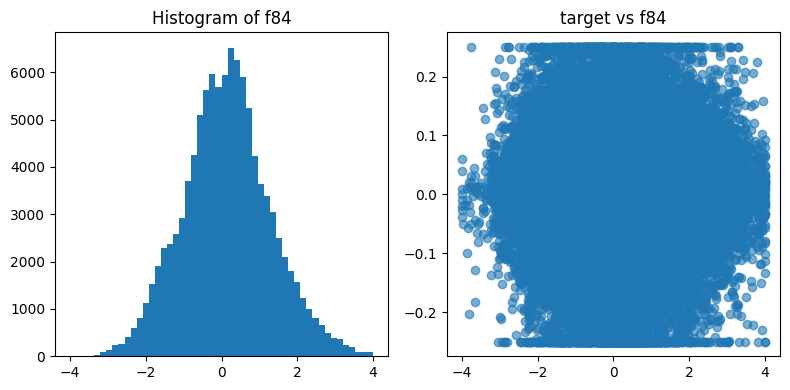

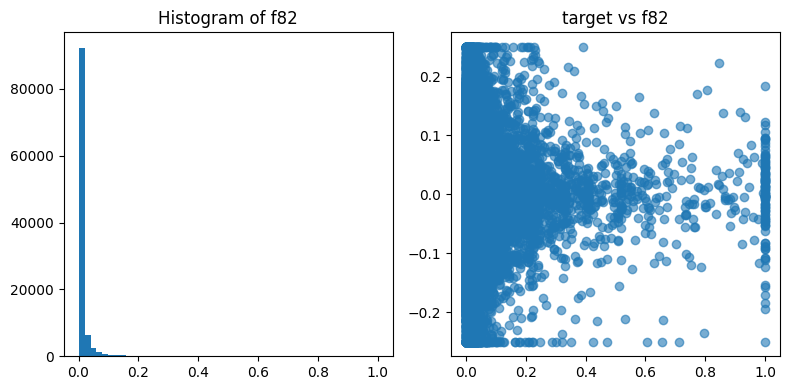

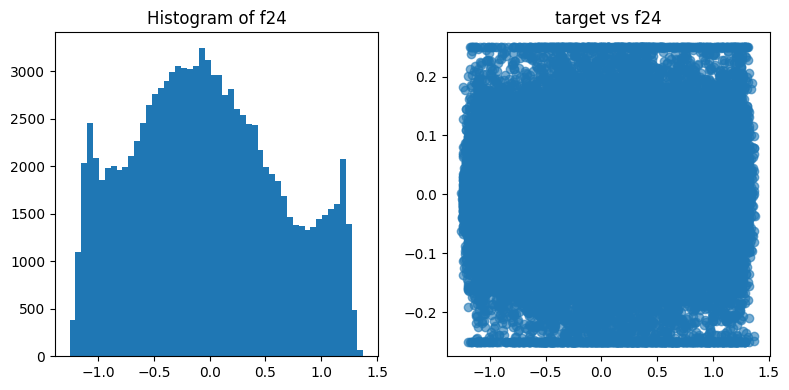

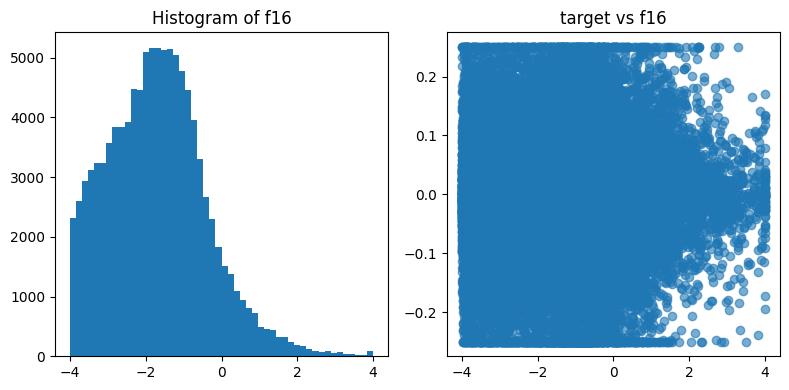

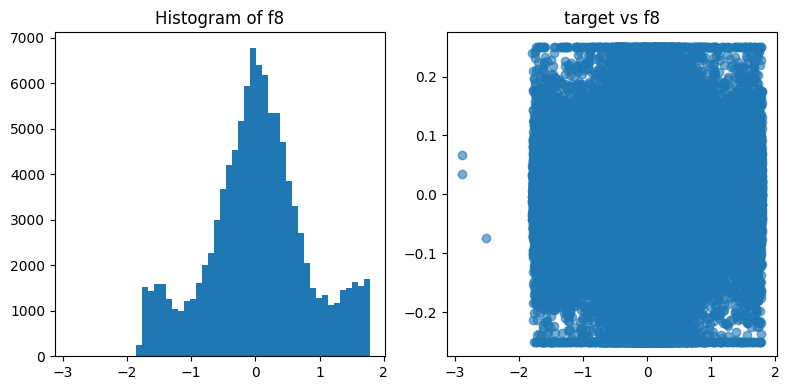

...

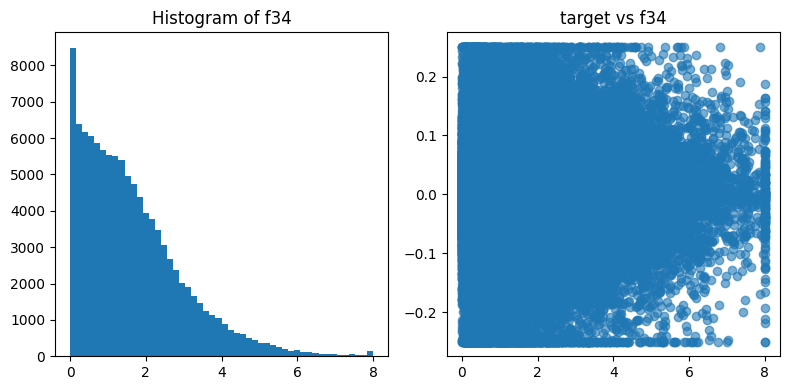

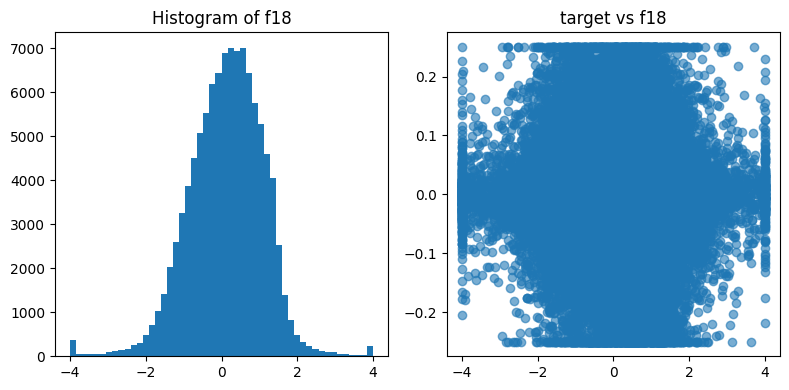

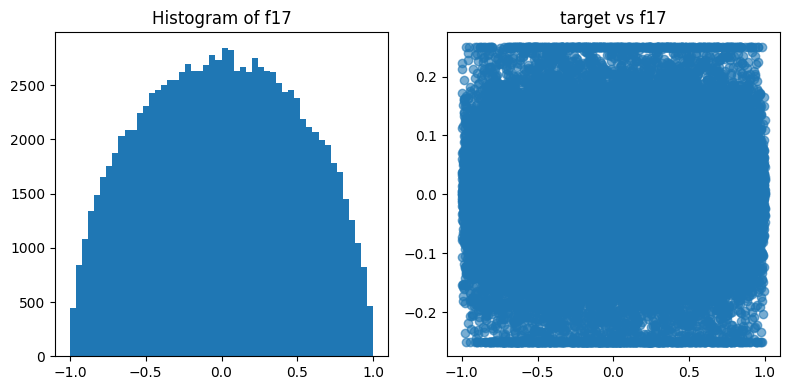

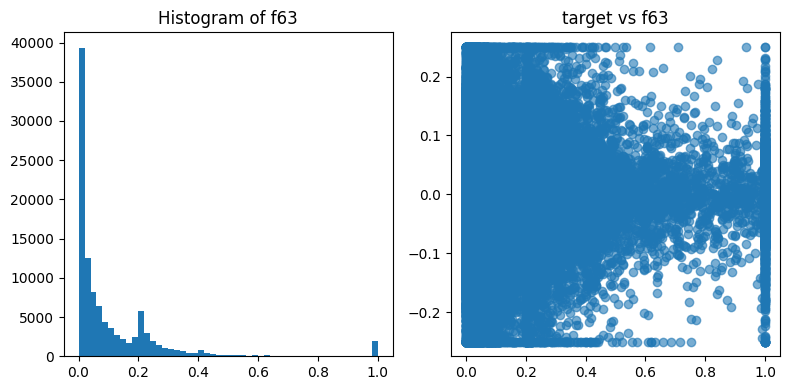

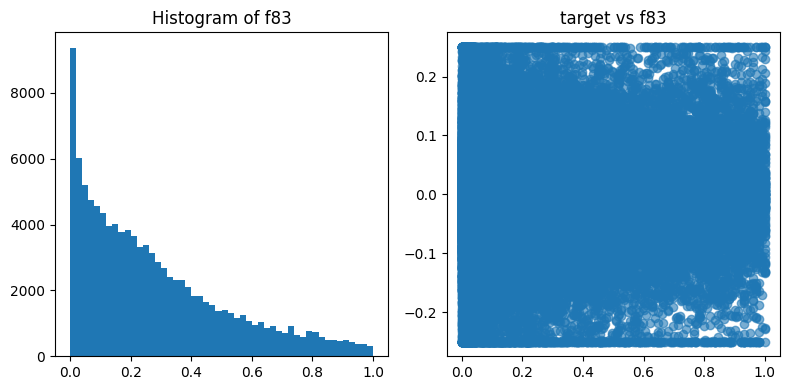

In [113]:
for key, _ in lag_dict.items():
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))  
    
    ax[0].hist(df_lag_no_nan[key], bins=50) 
    ax[0].set_title(f'Histogram of {key}')

    ax[1].scatter(df_lag_no_nan[key], df_lag_no_nan['target'], alpha=0.6)
    ax[1].set_title(f'target vs {key}')
    
    plt.tight_layout()  
    plt.show()

In [2]:
df = pd.read_csv('/kaggle/input/trexquant-2025-summer-intern-challenge-iitkgp/TQ_Train_Kaggle.csv')

In [3]:
df

,row_id,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,target
0,1,1.65,-3.48,NaN,0.12,0.22,0.20,NaN,-0.29,-0.36,-1.88,-2.82,NaN,NaN,NaN,0.09,-0.72,0.12,1.11,3.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.41,-0.41,0.44,0.00,NaN,-1.66,-0.63,NaN,NaN,0.77,NaN,NaN,NaN,0.79,NaN,NaN,NaN,NaN,NaN,NaN,-0.25,NaN,NaN,0.39,2.82,3.52,NaN,0.72,0.62,-1.01,-0.97,0.02,NaN,0.02,NaN,1.47,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.26,-2.20,0.66,-2.20,NaN,0.03,0.01,0.30,-0.14,-1.95,NaN,0.99,-0.08
1,2,2.55,-0.93,NaN,0.17,0.27,0.08,NaN,-0.40,-0.54,-1.87,1.22,NaN,NaN,0.08,0.85,-0.76,-0.02,2.01,0.11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.10,-0.10,0.49,0.00,1.24,3.02,-0.26,NaN,NaN,-2.11,NaN,NaN,0.66,0.96,NaN,NaN,NaN,NaN,NaN,NaN,2.19,NaN,NaN,-1.22,-0.22,-3.60,NaN,0.91,-0.97,-0.77,-0.97,0.02,NaN,0.01,-0.09,-3.61,NaN,0.00,-3.11,NaN,-4.00,NaN,NaN,NaN,0.50,NaN,0.24,-0.80,0.57,-0.81,NaN,0.16,0.00,0.19,1.18,0.12,NaN,-0.22,0.06
2,3,-3.73,0.99,NaN,0.15,0.16,0.40,NaN,-0.66,1.51,-1.66,-0.90,NaN,NaN,1.00,0.59,-3.18,-0.71,-2.74,3.03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.09,-0.09,0.45,0.00,1.43,1.01,-0.26,NaN,NaN,0.99,NaN,NaN,0.67,0.46,NaN,NaN,NaN,NaN,NaN,NaN,-0.13,NaN,NaN,0.44,-0.55,3.35,NaN,1.52,0.68,-0.85,0.37,0.02,NaN,0.11,0.22,0.45,NaN,0.00,-1.14,NaN,-4.00,NaN,NaN,NaN,0.76,NaN,0.22,0.15,0.52,0.21,NaN,0.04,0.00,0.18,-0.73,-0.37,NaN,0.36,0.00
3,4,2.12,0.04,NaN,0.12,0.76,-0.02,NaN,-0.27,-1.61,-1.77,-1.16,NaN,NaN,-0.22,0.43,-3.99,0.73,0.27,3.09,0.93,-0.98,-0.04,NaN,NaN,NaN,NaN,NaN,-0.09,NaN,0.09,0.35,0.44,0.00,1.53,1.90,0.24,NaN,NaN,0.10,NaN,NaN,0.81,0.65,NaN,NaN,NaN,NaN,NaN,NaN,-0.49,NaN,NaN,3.45,0.87,3.03,NaN,1.41,0.02,2.46,-0.97,0.02,-1.61,1.00,-0.05,-0.91,-0.19,-0.28,-2.55,NaN,-4.00,NaN,NaN,NaN,0.55,NaN,0.19,-0.37,0.49,-0.40,NaN,0.08,0.00,0.33,-0.40,-0.19,NaN,0.01,-0.03
4,5,-0.85,-0.02,NaN,0.22,0.12,-0.27,NaN,1.56,-0.36,-2.62,-1.59,NaN,1.15,0.52,0.32,-2.02,0.88,-0.81,-0.07,1.71,0.42,-0.83,NaN,NaN,NaN,NaN,NaN,0.01,NaN,0.09,0.21,0.43,0.00,1.49,1.88,NaN,NaN,NaN,0.70,NaN,NaN,0.87,2.47,NaN,NaN,NaN,NaN,NaN,NaN,-0.65,NaN,NaN,1.20,2.58,3.76,NaN,0.93,0.90,-1.49,0.40,0.02,NaN,0.03,-0.04,-0.94,-0.19,-0.05,-3.11,NaN,0.06,NaN,NaN,NaN,0.34,NaN,0.06,1.64,0.23,1.50,NaN,0.05,0.00,0.54,0.51,-0.08,NaN,-0.01,0.06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
105437,173625,1.14,1.10,1.11,0.07,0.00,0.50,-3.97,-0.10,-0.14,-3.05,-3.51,-2.07,NaN,NaN,NaN,-2.19,-0.19,1.33,-1.53,NaN,NaN,NaN,1.37,1.12,-1.67,0.21,-0.47,-0.34,NaN,0.05,0.43,0.86,1.00,0.34,3.12,NaN,-1.41,NaN,-1.44,-1.19,NaN,NaN,0.34,0.56,0.25,NaN,NaN,NaN,0.18,-1.02,0.31,2.77,-4.00,-2.42,3.92,NaN,-0.87,0.24,-0.04,-0.97,0.24,NaN,NaN,NaN,-4.00,NaN,0.01,0.37,NaN,0.00,NaN,0.50,-1.33,0.42,0.28,0.08,0.13,0.19,-0.80,NaN,0.14,0.02,0.46,NaN,0.10,3.48,-0.28,0.00
105438,173659,-1.37,0.29,NaN,0.06,0.00,0.16,NaN,0.34,0.24,-2.28,-1.51,-0.46,NaN,NaN,NaN,NaN,0.09,0.69,0.04,NaN,NaN,NaN,-2.43,1.14,-4.00,2.44,-0.18,NaN,NaN,0.25,0.24,NaN,0.00,0.00,2.78,-0.04,NaN,NaN,NaN,0.52,NaN,NaN,0.55,-1.46,-0.62,NaN,NaN,NaN,0.34,1.89,0.39,-0.12,1.31,-0.05,NaN,NaN,NaN,-0.78,NaN,-0.78,-0.24,NaN,NaN,NaN,2.78,NaN,-0.03,0.50,NaN,0.00,NaN,0.12,1.80,0.22,0.06,NaN,NaN,0.19,-1.41,NaN,NaN,NaN,NaN,NaN,0.92,1.09,0.98,-0.01
105439,173670,0.05,0.34,NaN,0.08,0.22,-0.16,NaN,0.18,0.18,-1.16,-2.15,-1.16,NaN,NaN,NaN,-2.17,-0.42,1.29,-1.02,NaN,NaN,NaN,-3.83,-0.30,-2.54,0.84,-0.37,-0.53,NaN,0.19,0.28,-1.21,0.00,0.34,3.12,-0.01,-2.00,NaN,NaN,0.47,NaN,NaN,0.42,-1.32,-0.38,-0.50

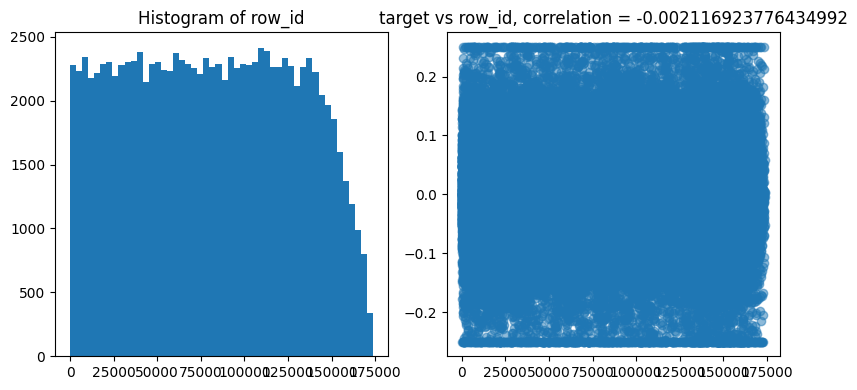

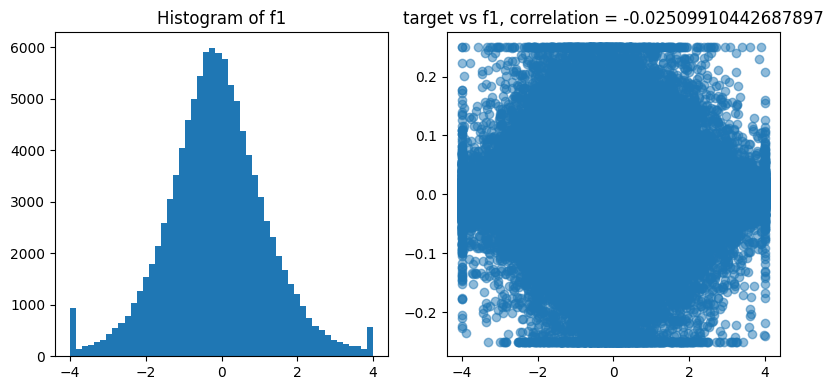

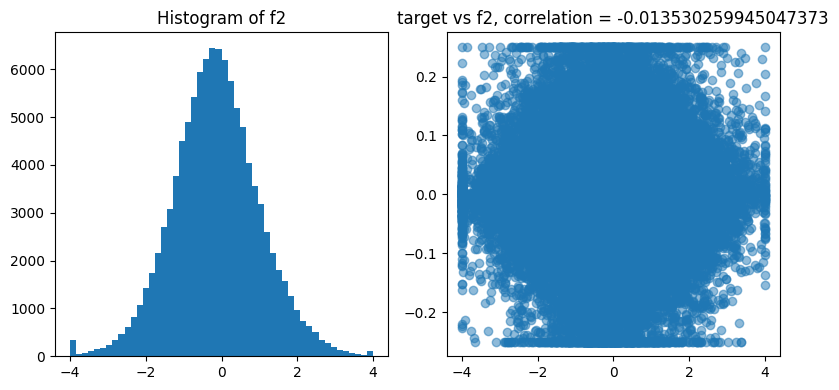

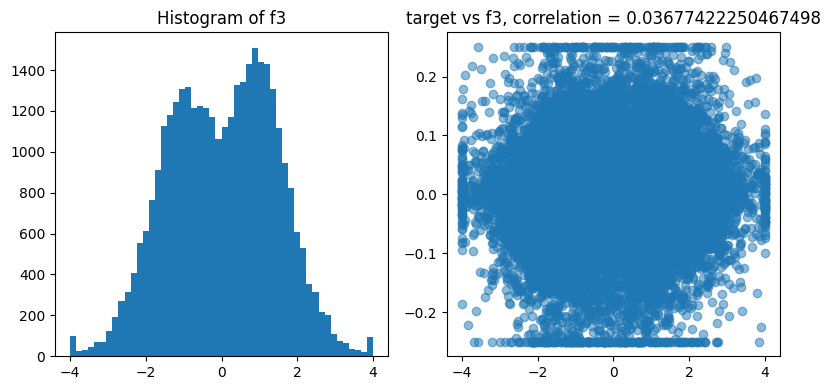

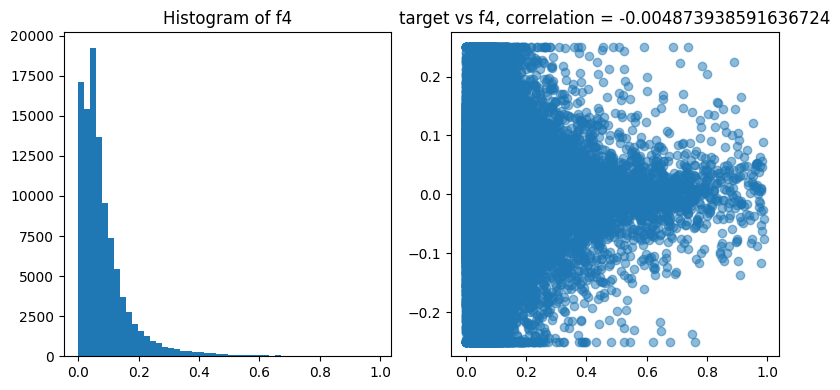

...

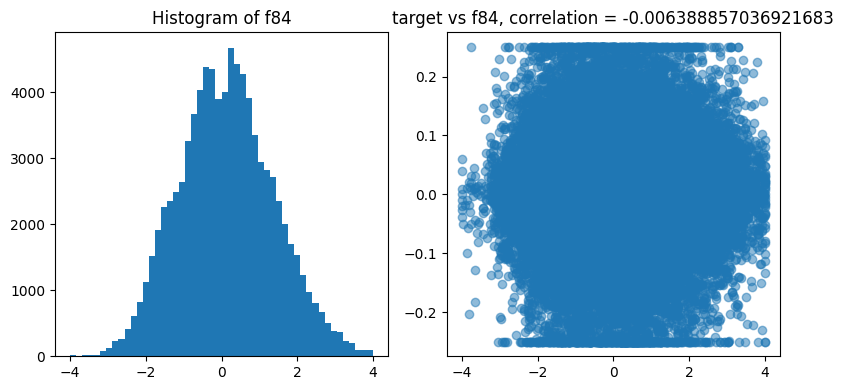

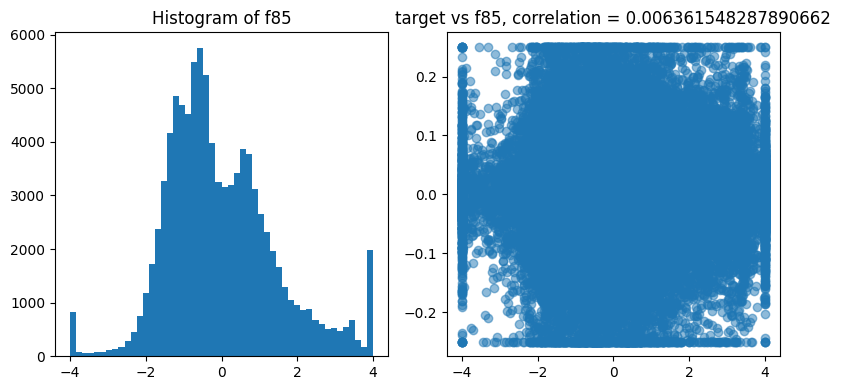

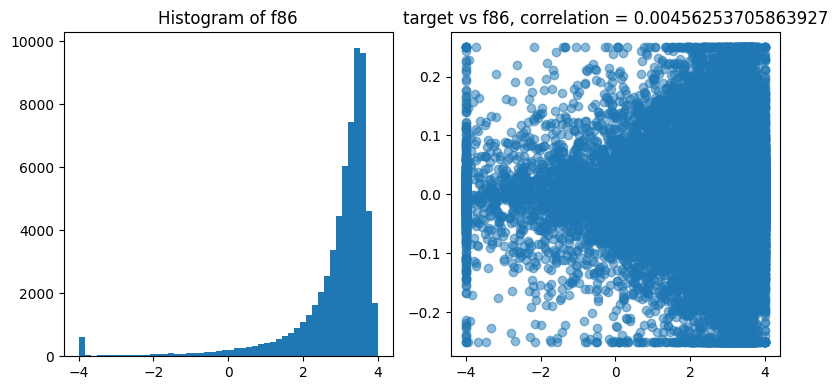

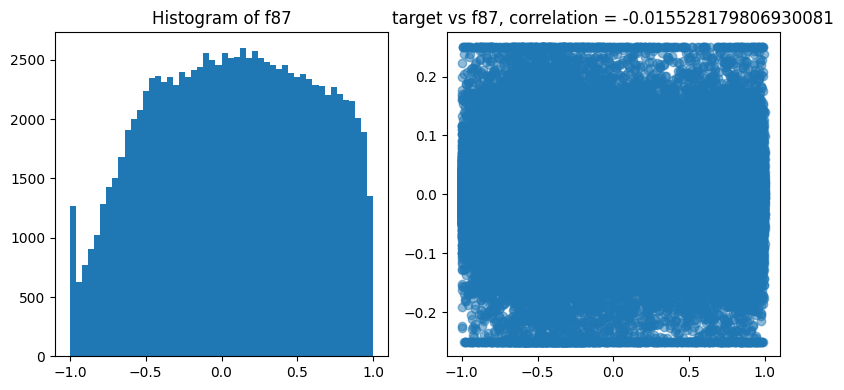

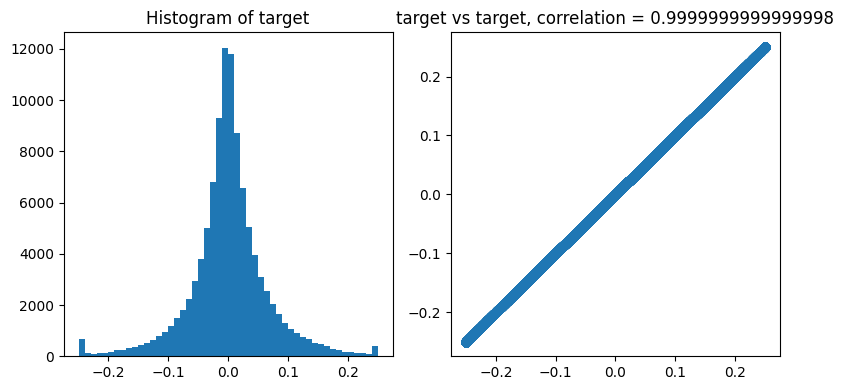

In [4]:
for col in df.columns:
    corr = df[col].corr(df['target'])
    
    fig, ax = plt.subplots(1, 2, figsize=(8, 4))  
    
    ax[0].hist(df[col], bins=50) 
    ax[0].set_title(f'Histogram of {col}')

    ax[1].scatter(df[col], df['target'], alpha=0.5)
    ax[1].set_title(f'target vs {col}, correlation = {corr}')
    
    plt.tight_layout()  
    plt.show()

In [ ]:
gfg 